In [1]:
import os
import sys
import json
import argparse

import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import nibabel as nib

from glob import glob
from nilearn import plotting
from nilearn import datasets

from nilearn.glm.second_level import SecondLevelModel
from nilearn.glm.second_level import make_second_level_design_matrix
from nilearn.image import smooth_img, new_img_like

In [2]:
from nilearn.image import threshold_img
from nilearn.glm import threshold_stats_img

from nilearn import surface
from nilearn import datasets
fsaverage = datasets.fetch_surf_fsaverage()
mni152_template = datasets.load_mni152_template(resolution=1)


In [3]:
task_label = 'tonecat'

project_dir = os.path.join('/bgfs/bchandrasekaran/krs228/data/', 'FLT/')
bidsroot = os.path.join(project_dir, 'data_denoised', 
                        #'data_bids'
                       )
deriv_dir = os.path.join(project_dir, 'derivatives')

nilearn_dir = os.path.join(bidsroot, 'derivatives', 'nilearn')

## Second-level analyses

Based on [nilearn documentation](https://nilearn.github.io/stable/auto_examples/05_glm_second_level/plot_thresholding.html#statistical-testing-of-a-second-level-analysis)

### Build the group-level design matrix

#### Read the `participants.tsv` file from the BIDS root directory

In [5]:
participants_fpath = os.path.join(bidsroot, 'participants.tsv')
participants_df = pd.read_csv(participants_fpath, sep='\t')

# subjects to ignore (not fully processed, etc.)
ignore_subs = ['sub-FLT27',
               'sub-FLT15', # missing 12/10
               'sub-FLT07', # bad QA 11/14/23
              ]
participants_df.drop(participants_df[participants_df.participant_id.isin(ignore_subs)].index,
                     inplace=True)

# re-sort by participant ID
participants_df.sort_values(by=['participant_id'], 
                            ignore_index=True, 
                            inplace=True)

In [6]:
participants_fpath

'/bgfs/bchandrasekaran/krs228/data/FLT/data_denoised/participants.tsv'

In [7]:
print(participants_df)

   participant_id  age sex         group  FFR_id
0       sub-FLT02   21   F  non-Mandarin  1002.0
1       sub-FLT03   25   F      Mandarin  2002.0
2       sub-FLT04   21   F  non-Mandarin  1003.0
3       sub-FLT05   26   M      Mandarin  3010.0
4       sub-FLT06   21   F  non-Mandarin  3001.0
5       sub-FLT08   23   F      Mandarin  2005.0
6       sub-FLT09   30   F  non-Mandarin  3002.0
7       sub-FLT10   23   F      Mandarin  2006.0
8       sub-FLT11   20   F  non-Mandarin  1005.0
9       sub-FLT12   20   F  non-Mandarin  3004.0
10      sub-FLT13   23   F  non-Mandarin  3005.0
11      sub-FLT14   23   M  non-Mandarin  3006.0
12      sub-FLT17   29   F      Mandarin     NaN
13      sub-FLT18   24   M      Mandarin  2016.0
14      sub-FLT19   24   M      Mandarin  2018.0
15      sub-FLT20   26   F  non-Mandarin  3008.0
16      sub-FLT21   21   M      Mandarin  2011.0
17      sub-FLT22   41   F      Mandarin  2017.0
18      sub-FLT23   26   F      Mandarin  2013.0
19      sub-FLT24   

In [8]:
# create group-specific lists of subject IDs
sub_list_mand = list(participants_df.participant_id[participants_df.group=='Mandarin'])
sub_list_nman = list(participants_df.participant_id[participants_df.group=='non-Mandarin'])

In [9]:
sub_list_mand

['sub-FLT03',
 'sub-FLT05',
 'sub-FLT08',
 'sub-FLT10',
 'sub-FLT17',
 'sub-FLT18',
 'sub-FLT19',
 'sub-FLT21',
 'sub-FLT22',
 'sub-FLT23',
 'sub-FLT24',
 'sub-FLT26']

#### Create design matrixes

In [10]:
# difference between groups
subjects_label = list(participants_df.participant_id)
groups_label = list(participants_df.group)
design_mat_groupdiff = pd.DataFrame({'Mand': groups_label,
                                     'NMan': groups_label,
                                    }
                                   )

design_mat_groupdiff['Mand'].loc[design_mat_groupdiff['Mand'] == 'Mandarin'] = 1
design_mat_groupdiff['Mand'].loc[design_mat_groupdiff['Mand'] == 'non-Mandarin'] = 0
design_mat_groupdiff['NMan'].loc[design_mat_groupdiff['NMan'] == 'Mandarin'] = 0
design_mat_groupdiff['NMan'].loc[design_mat_groupdiff['NMan'] == 'non-Mandarin'] = 1
design_mat_groupdiff = design_mat_groupdiff.astype('int')
print(design_mat_groupdiff)

    Mand  NMan
0      0     1
1      1     0
2      0     1
3      1     0
4      0     1
5      1     0
6      0     1
7      1     0
8      0     1
9      0     1
10     0     1
11     0     1
12     1     0
13     1     0
14     1     0
15     0     1
16     1     0
17     1     0
18     1     0
19     1     0
20     0     1
21     1     0
22     0     1
23     0     1


In [11]:
print(subjects_label)

['sub-FLT02', 'sub-FLT03', 'sub-FLT04', 'sub-FLT05', 'sub-FLT06', 'sub-FLT08', 'sub-FLT09', 'sub-FLT10', 'sub-FLT11', 'sub-FLT12', 'sub-FLT13', 'sub-FLT14', 'sub-FLT17', 'sub-FLT18', 'sub-FLT19', 'sub-FLT20', 'sub-FLT21', 'sub-FLT22', 'sub-FLT23', 'sub-FLT24', 'sub-FLT25', 'sub-FLT26', 'sub-FLT28', 'sub-FLT30']


# Run-all

### Get files

In [21]:
contrast_label = 'sound'
fwhm = 0.00
searchrad = 5
model_label = 'run-all_LSS' # 'stimulus_per_run_LSS'
space_label = 'MNI152NLin2009cAsym'
search_label = f'rsa-searchlight_fwhm-{fwhm:.02f}_searchvox-{searchrad}_{model_label}'
l1_dir = os.path.join(bidsroot, 'derivatives', 
                      'nilearn', f'level-1_fwhm-{fwhm:.02f}')
l2_dir = os.path.join(bidsroot, 'derivatives', 
                      'nilearn', f'level-2_fwhm-{fwhm:.02f}_{model_label}')
os.makedirs(l2_dir, exist_ok=True)

In [22]:
l2_dir

'/bgfs/bchandrasekaran/krs228/data/FLT/data_denoised/derivatives/nilearn/level-2_fwhm-0.00_run-all_LSS'

In [23]:
model_list = ['Tone', 'Talker']

model_label = 'Tone'

In [25]:
l1_fnames_groupdiff = [sorted(glob(l1_dir+f'/{sub_id}_space-{space_label}/{search_label}/' +
                                   '%s_fwhm-%.02f_searchvox-%d_rsa-searchlight_model-%s.nii.gz'%(sub_id, fwhm, searchrad, model_label)))[0] for sub_id in subjects_label]

In [26]:
l1_fnames_groupdiff

['/bgfs/bchandrasekaran/krs228/data/FLT/data_denoised/derivatives/nilearn/level-1_fwhm-0.00/sub-FLT02_space-MNI152NLin2009cAsym/rsa-searchlight_fwhm-0.00_searchvox-5_run-all_LSS/sub-FLT02_fwhm-0.00_searchvox-5_rsa-searchlight_model-Tone.nii.gz',
 '/bgfs/bchandrasekaran/krs228/data/FLT/data_denoised/derivatives/nilearn/level-1_fwhm-0.00/sub-FLT03_space-MNI152NLin2009cAsym/rsa-searchlight_fwhm-0.00_searchvox-5_run-all_LSS/sub-FLT03_fwhm-0.00_searchvox-5_rsa-searchlight_model-Tone.nii.gz',
 '/bgfs/bchandrasekaran/krs228/data/FLT/data_denoised/derivatives/nilearn/level-1_fwhm-0.00/sub-FLT04_space-MNI152NLin2009cAsym/rsa-searchlight_fwhm-0.00_searchvox-5_run-all_LSS/sub-FLT04_fwhm-0.00_searchvox-5_rsa-searchlight_model-Tone.nii.gz',
 '/bgfs/bchandrasekaran/krs228/data/FLT/data_denoised/derivatives/nilearn/level-1_fwhm-0.00/sub-FLT05_space-MNI152NLin2009cAsym/rsa-searchlight_fwhm-0.00_searchvox-5_run-all_LSS/sub-FLT05_fwhm-0.00_searchvox-5_rsa-searchlight_model-Tone.nii.gz',
 '/bgfs/bchandra

## WIP: fisher's r-to-z transformation

### loop through images and transform

In [17]:
diff_img_list = []

for sx, sub_sl_fpath in enumerate(l1_fnames_groupdiff):
    
    sub_sl_img = nib.load(sub_sl_fpath)
    sub_sl_data = sub_sl_img.get_fdata()

    # fisher transform r-to-z
    diff_data = np.arctanh(sub_sl_data)

    diff_img = new_img_like(sub_sl_img, diff_data)

    diff_img_list.append(diff_img)

### Mandarin-speaking participants group RSA

In [18]:
#second_level_model = SecondLevelModel().fit(smoothed_l1_fnames_groupdiff, design_matrix=design_mat_groupdiff)
second_level_model = SecondLevelModel().fit(diff_img_list, design_matrix=design_mat_groupdiff)

z_map = second_level_model.compute_contrast(second_level_contrast=[1, 0,], output_type='z_score')

In [19]:
group_label = 'Mand'
out_fname = 'group-{}_{}_model-{}_map-zstat.nii.gz'.format(group_label, search_label, model_label)
out_fpath = os.path.join(l2_dir, out_fname)
nib.save(z_map, out_fpath)

In [20]:
print(out_fpath)

/bgfs/bchandrasekaran/krs228/data/FLT/data_denoised/derivatives/nilearn/level-2_fwhm-0.00/group-Mand_rsa-searchlight_fwhm-0.00_searchvox-5_run-all_LSS_model-Tone_map-zstat.nii.gz


In [31]:
from nilearn.image import threshold_img
from nilearn.glm import threshold_stats_img
alpha = 0.01
cthresh = 10
cluster_correct = None # 'fdr'

thresholded_map, zthresh = threshold_stats_img(
                            z_map,
                            alpha=alpha,
                            height_control=cluster_correct,
                            cluster_threshold=cthresh,
                            two_sided=False,
                        )

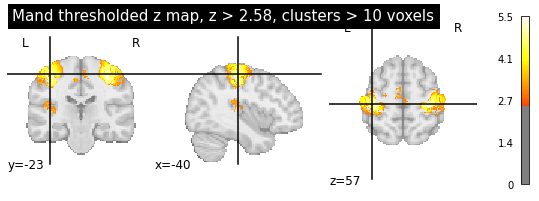

In [32]:
plotting.plot_stat_map(
    thresholded_map, #cut_coords=[17,12,5], 
    threshold=threshold,
    title='%s thresholded z map, z > %.02f, clusters > %d voxels'%(group_label, threshold, cthresh))

/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/numpy/core/fromnumeric.py:758: UserWarning: Warning: 'partition' will ignore the 'mask' of the MaskedArray.
  a.partition(kth, axis=axis, kind=kind, order=order)



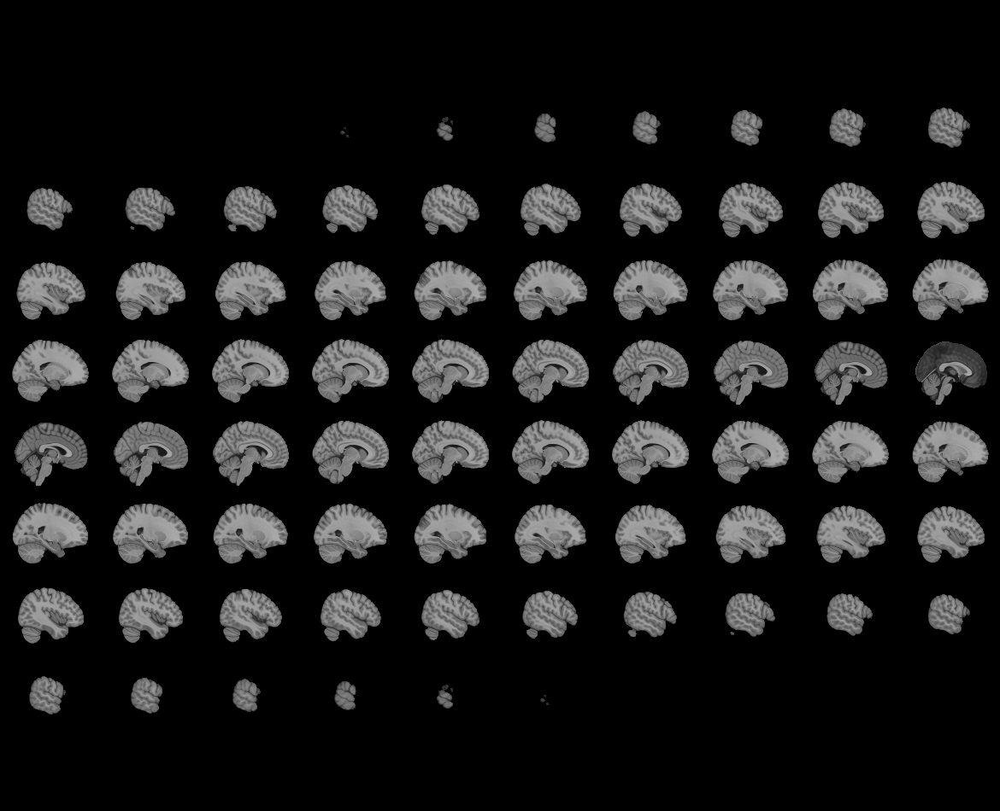
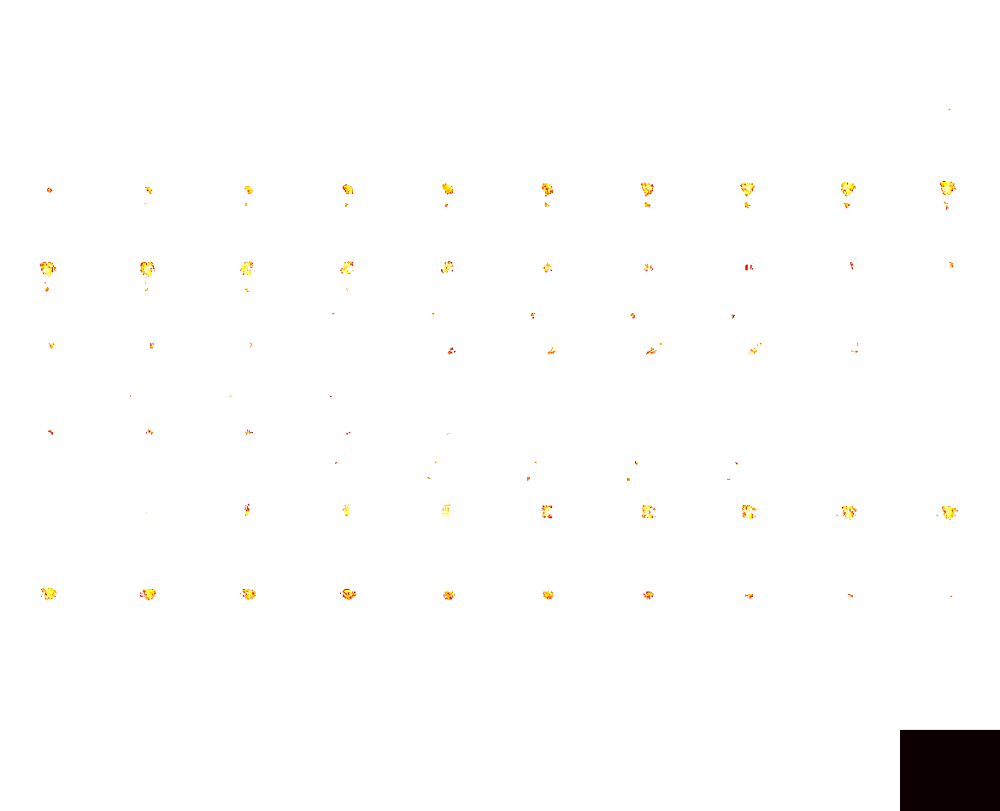

In [33]:
plotting.view_img(thresholded_map,
                  threshold=threshold,
                  symmetric_cmap=True)

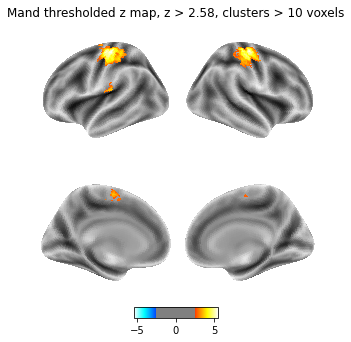

In [45]:
plotting.plot_img_on_surf(thresholded_map,
                          #surf_mesh='fsaverage', # comment out for faster default (fsaverage5)
                          views=['lateral', 'medial'],
                          hemispheres=['left', 'right'],
                          inflate=True,
                          threshold=threshold,
                          #cmap='Reds',
                          colorbar=True,
                          title='%s thresholded z map, z > %.02f, clusters > %d voxels'%(group_label, threshold, cthresh))
plotting.show()

file saved to  /bgfs/bchandrasekaran/krs228/data/FLT/data_denoised/derivatives/nilearn/level-2_fwhm-0.00/group-Mand_rsa-searchlight_model-Tone_searchrad-5_fwhm-0.0_map-zstat_slice.png


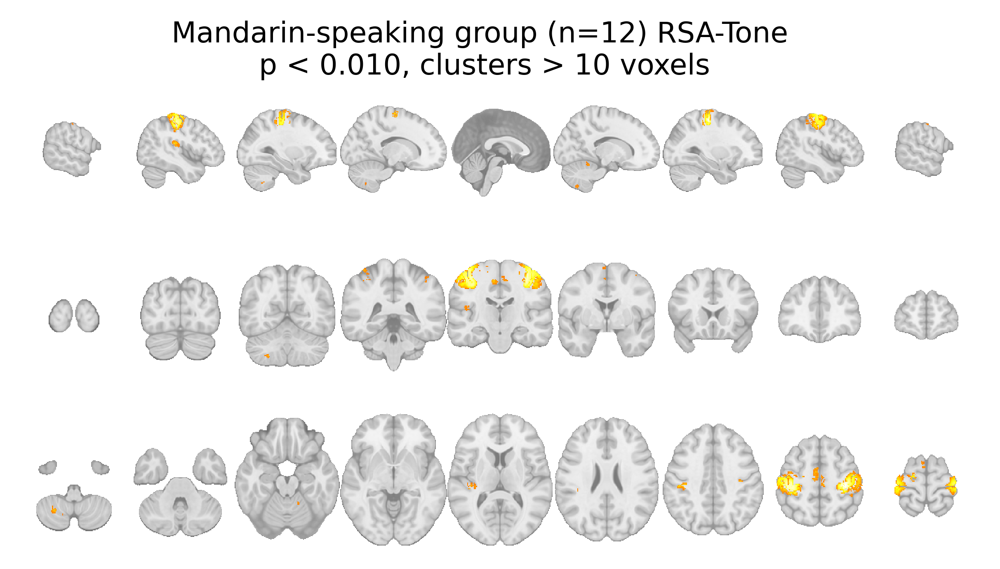

In [35]:
title = ('Mandarin-speaking group (n=%d) RSA-%s \n'
              'p < %.03f, clusters > %d voxels'%(len(sub_list_mand), model_label, alpha, cthresh))

#fig = plt.figure(constrained_layout=True, figsize=(8,4), dpi=500)
#subfigs = fig.subfigures(nrows=3, ncols=1)
fig, axes = plt.subplots(3, 1, figsize=(6,3), dpi=500)
fig.suptitle(title, fontsize='medium')

fig_fpath = os.path.join(l2_dir, 
                         f'group-{group_label}_rsa-searchlight_model-{model_label}_searchrad-{searchrad}_fwhm-{fwhm}_map-zstat_slice.png')

plotting.plot_stat_map(thresholded_map, 
                       bg_img=mni152_template, 
                       black_bg=False,
                       display_mode='x',
                       cut_coords=[-60, -45, -30, -15, 0, 15, 30, 45, 60],
                       colorbar=False,
                       annotate=False,
                       #title=title,
                       figure=fig, 
                       axes=axes[0])
plotting.plot_stat_map(thresholded_map, 
                       bg_img=mni152_template, 
                       black_bg=False,
                       display_mode='y',
                       cut_coords=[-100, -80, -60, -40, -20, 0, 20, 40, 60],
                       colorbar=False,
                       annotate=False,
                       #title=title,
                       figure=fig, 
                       axes=axes[1])
plotting.plot_stat_map(thresholded_map, 
                       bg_img=mni152_template, 
                       black_bg=False,
                       display_mode='z',
                       cut_coords=[-50, -35, -20, -5, 10, 25, 40, 55, 70],
                       colorbar=False,
                       annotate=False,
                       #title=title,
                       #figure=fig, 
                       axes=axes[2])

fig.savefig(fig_fpath)
print('file saved to ', fig_fpath)

### Non-Mandarin-speaking participants group RSA

In [36]:
#second_level_model = SecondLevelModel().fit(smoothed_l1_fnames_groupdiff, design_matrix=design_mat_groupdiff)
second_level_model = SecondLevelModel().fit(diff_img_list, design_matrix=design_mat_groupdiff)

z_map = second_level_model.compute_contrast(second_level_contrast=[0,1,], output_type='z_score')

In [37]:
group_label = 'NMan'
out_fname = 'group-{}_{}_model-{}_map-zstat.nii.gz'.format(group_label, search_label, model_label)
out_fpath = os.path.join(l2_dir, out_fname)
nib.save(z_map, out_fpath)

In [49]:
alpha = 0.001
cthresh = 10
cluster_correct =  'fdr' # None

thresholded_map, zthresh = threshold_stats_img(
                            z_map,
                            alpha=alpha,
                            height_control=cluster_correct,
                            cluster_threshold=cthresh,
                            two_sided=False,
                        )

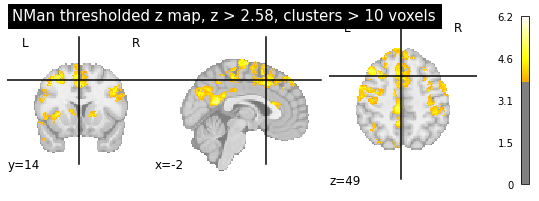

In [50]:
plotting.plot_stat_map(
    thresholded_map, #cut_coords=[17,12,5], 
    threshold=zthresh,
    title='%s thresholded z map, z > %.02f, clusters > %d voxels'%(group_label, threshold, cthresh))

/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/numpy/core/fromnumeric.py:758: UserWarning: Warning: 'partition' will ignore the 'mask' of the MaskedArray.
  a.partition(kth, axis=axis, kind=kind, order=order)



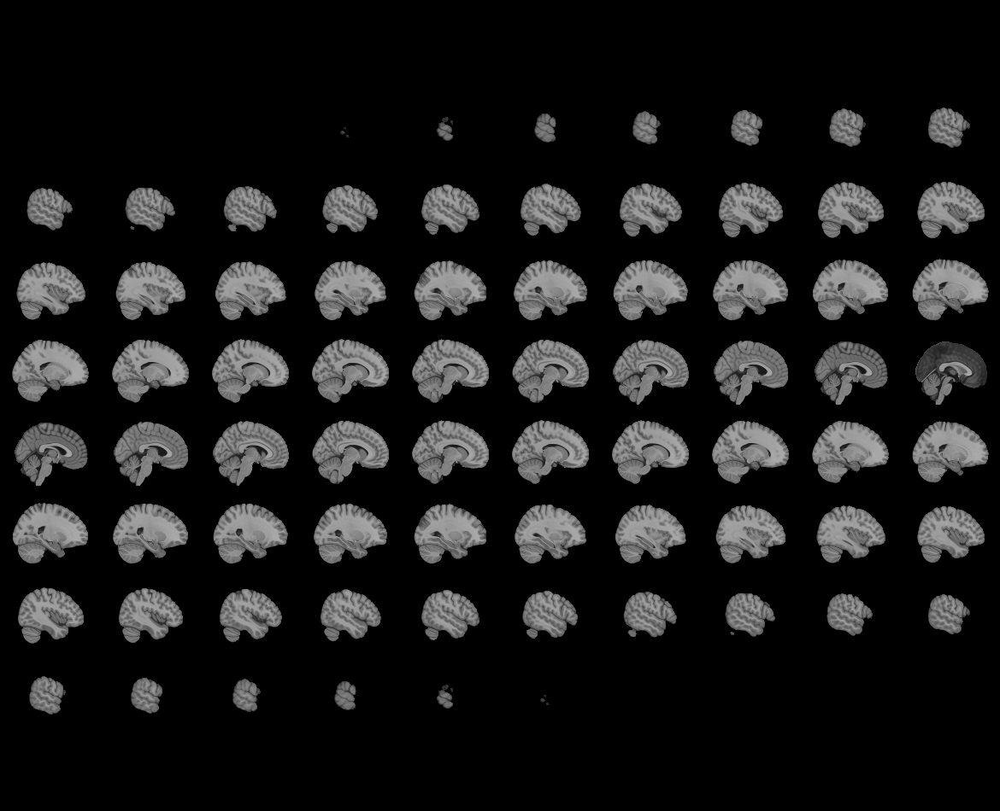
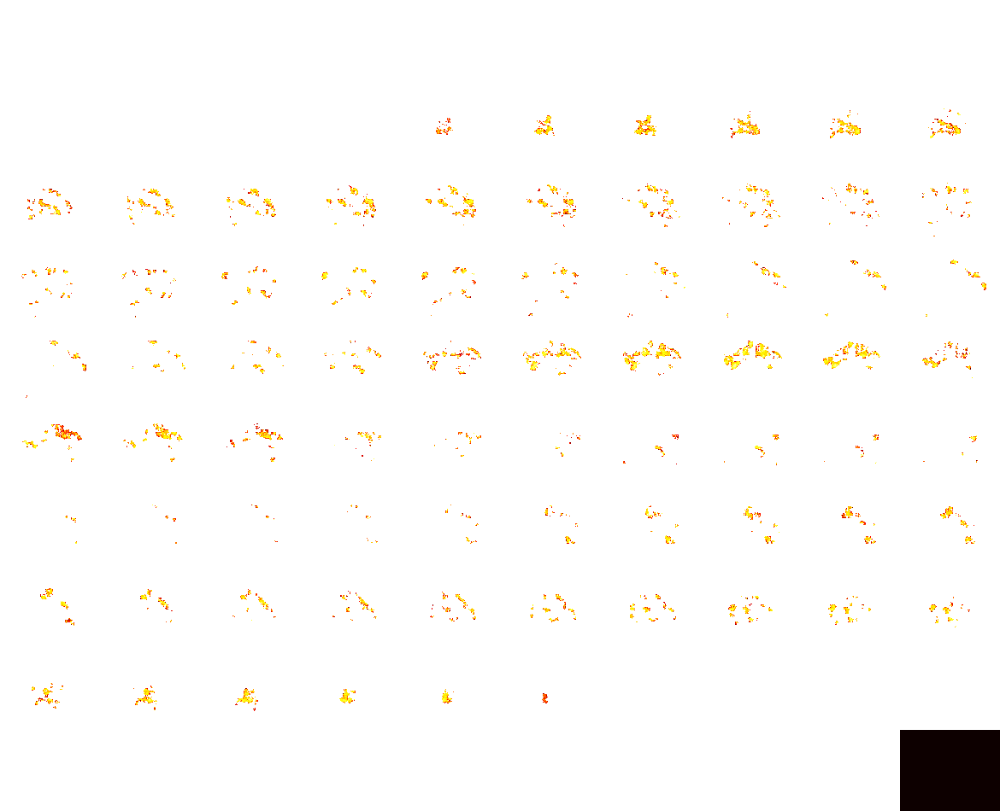

In [51]:
plotting.view_img(thresholded_map,
                  threshold=zthresh,
                  symmetric_cmap=True)

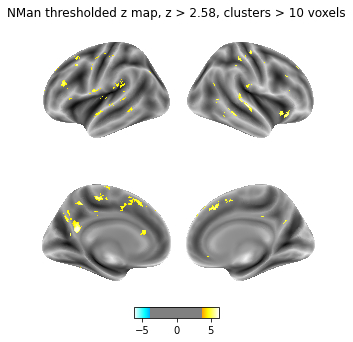

In [52]:
plotting.plot_img_on_surf(thresholded_map,
                          surf_mesh='fsaverage', # comment out for faster default (fsaverage5)
                          views=['lateral', 'medial'],
                          hemispheres=['left', 'right'],
                          inflate=True,
                          threshold=zthresh,
                          #cmap='Reds',
                          colorbar=True,
                          title='%s thresholded z map, z > %.02f, clusters > %d voxels'%(group_label, threshold, cthresh))
plotting.show()

file saved to  /bgfs/bchandrasekaran/krs228/data/FLT/data_denoised/derivatives/nilearn/level-2_fwhm-0.00/group-NMan_rsa-searchlight_model-Tone_searchrad-5_fwhm-0.0_map-zstat_slice.png


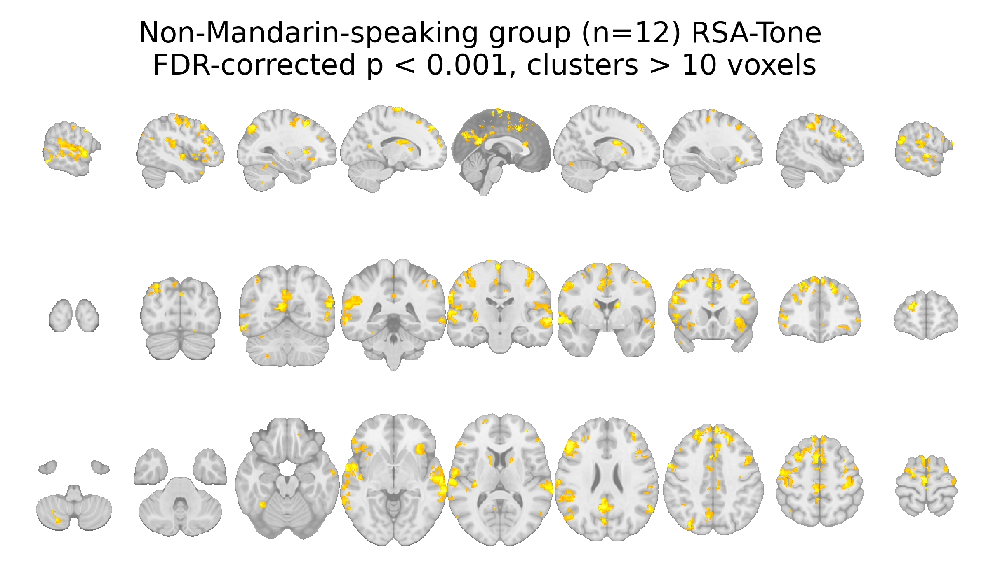

In [53]:
title = ('Non-Mandarin-speaking group (n=%d) RSA-%s \n'
         'FDR-corrected p < %.03f, clusters > %d voxels'%(len(sub_list_nman), model_label, alpha, cthresh))

#fig = plt.figure(constrained_layout=True, figsize=(8,4), dpi=500)
#subfigs = fig.subfigures(nrows=3, ncols=1)
fig, axes = plt.subplots(3, 1, figsize=(6,3), dpi=500)
fig.suptitle(title, fontsize='medium')

fig_fpath = os.path.join(l2_dir, 
                         f'group-{group_label}_rsa-searchlight_model-{model_label}_searchrad-{searchrad}_fwhm-{fwhm}_map-zstat_slice.png')

plotting.plot_stat_map(thresholded_map, 
                       bg_img=mni152_template, 
                       black_bg=False,
                       display_mode='x',
                       cut_coords=[-60, -45, -30, -15, 0, 15, 30, 45, 60],
                       colorbar=False,
                       annotate=False,
                       #title=title,
                       figure=fig, 
                       axes=axes[0])
plotting.plot_stat_map(thresholded_map, 
                       bg_img=mni152_template, 
                       black_bg=False,
                       display_mode='y',
                       cut_coords=[-100, -80, -60, -40, -20, 0, 20, 40, 60],
                       colorbar=False,
                       annotate=False,
                       #title=title,
                       figure=fig, 
                       axes=axes[1])
plotting.plot_stat_map(thresholded_map, 
                       bg_img=mni152_template, 
                       black_bg=False,
                       display_mode='z',
                       cut_coords=[-50, -35, -20, -5, 10, 25, 40, 55, 70],
                       colorbar=False,
                       annotate=False,
                       #title=title,
                       #figure=fig, 
                       axes=axes[2])

fig.savefig(fig_fpath)
print('file saved to ', fig_fpath)

### Group differences in RSA searchlight

In [51]:
#second_level_model = SecondLevelModel().fit(smoothed_l1_fnames_groupdiff, design_matrix=design_mat_groupdiff)
second_level_model = SecondLevelModel().fit(diff_img_list, design_matrix=design_mat_groupdiff)
z_map_diff = second_level_model.compute_contrast(second_level_contrast=[1, -1,], output_type='z_score')

In [ ]:
'''
for model_label in [model_label]: #model_list:
    print(model_label)
    l1_fnames_groupdiff = [sorted(glob(l1_dir+'/%s_space-%s/%s/'%(sub_id, space_label, search_label) +
                                   '%s_rsa-searchlight_model-%s.nii.gz'%(sub_id, model_label)))[0] for sub_id in subjects_label]
    
    diff_img_list = []
    for sx, sub_sl_fpath in enumerate(l1_fnames_groupdiff):

        sub_sl_img = nib.load(sub_sl_fpath)
        sub_sl_data = sub_sl_img.get_fdata()

        # fisher transform r-to-z
        diff_data = np.arctanh(sub_sl_data)
        diff_img = new_img_like(sub_sl_img, diff_data)
        diff_img_list.append(diff_img)

    second_level_model = SecondLevelModel().fit(diff_img_list, design_matrix=design_mat_groupdiff)
    z_map_diff = second_level_model.compute_contrast(second_level_contrast=[1, -1,], output_type='z_score')

    group_label = 'diff-Mand-gt-NMan'
    out_fname = 'group-{}_{}_model-{}_map-zstat.nii.gz'.format(group_label, search_label, model_label) 
    out_fpath = os.path.join(l2_dir, out_fname)
    nib.save(z_map_diff, out_fpath)
'''

In [52]:
threshold = 2.58
cthresh = 10
thresh_diff_map = threshold_img(
                                z_map_diff,
                                threshold=threshold,
                                cluster_threshold=cthresh,
                                two_sided=True,
                            )

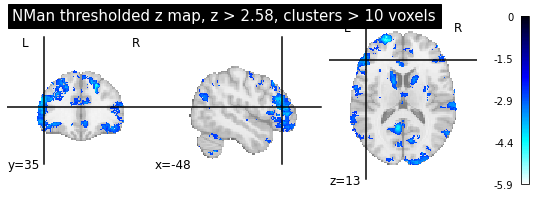

In [53]:
plotting.plot_stat_map(
    thresh_diff_map, 
    title='%s thresholded z map, z > %.02f, clusters > %d voxels'%(group_label, threshold, cthresh))

/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/numpy/core/fromnumeric.py:758: UserWarning: Warning: 'partition' will ignore the 'mask' of the MaskedArray.
  a.partition(kth, axis=axis, kind=kind, order=order)



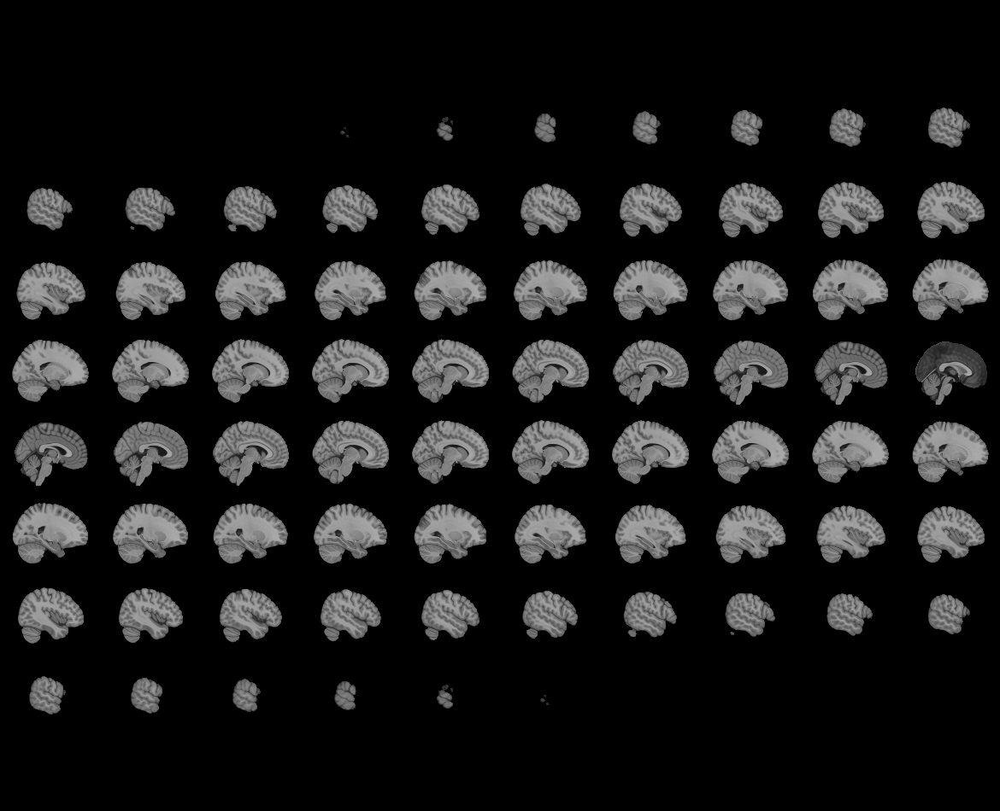
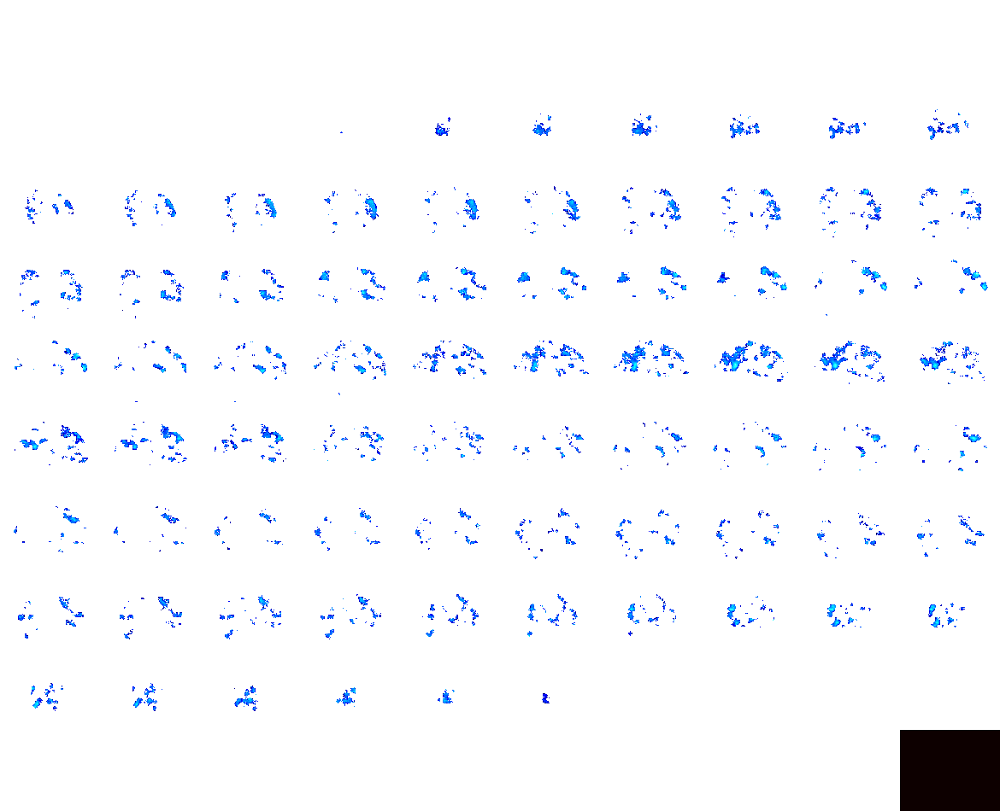

In [54]:
plotting.view_img(thresh_diff_map,
                  threshold=threshold,
                  symmetric_cmap=True)

In [ ]:
plotting.plot_img_on_surf(thresh_diff_map,
                          #surf_mesh='fsaverage', # comment out for faster default (fsaverage5)
                          views=['lateral', 'medial'],
                          hemispheres=['left', 'right'],
                          inflate=True,
                          threshold=threshold,
                          #cmap='Reds',
                          colorbar=True,
                          title='%s thresholded z map, z > %.02f, clusters > %d voxels'%(group_label, threshold, cthresh))
plotting.show()

## loop over all images and save

In [ ]:
for group_label in ['Mand', 'NMan', 'diff-Mand-gt-NMan']: #
    for model_label in model_list:
        img_fname = 'group-{}_rsa-searchlight_model-{}_map-zstat.nii.gz'.format(group_label, model_label)
        img_fpath = os.path.join(l2_dir, img_fname)

        fig_fpath = os.path.join('level-2_out', 
                                 'group-{}_rsa-searchlight_model-{}_map-zstat.png'.format(group_label, 
                                                                                          model_label))
        title='group-%s model-%s\nz > %.02f – clusters > %d voxels'%(group_label, model_label, threshold, cthresh)
        threshold = 2.58
        cthresh = 10
        thresholded_map = threshold_img(
                                        img_fpath,
                                        threshold=threshold,
                                        cluster_threshold=cthresh,
                                        two_sided=True,
                                    )
        #fig, ax = plt.subplots(subplot_kw={"projection": "3d"}, figsize=(5,4), dpi=500)
        fig, ax = plotting.plot_img_on_surf(thresholded_map,
                                  surf_mesh='fsaverage',
                                  views=['lateral', 'medial'],
                                  hemispheres=['left', 'right'],
                                  inflate=True,
                                  threshold=threshold,
                                  colorbar=True,
                                  title=title,
                                  #kwargs={'figure':fig, 'axes':ax}
                                 )
        fig.savefig(fig_fpath)
        print('file saved to ', fig_fpath)

In [ ]:
threshold = 2.58
cthresh = 10
    
for group_label in ['Mand', 'NMan', 'diff-Mand-gt-NMan']: # 'Mand', 'NMan', 'diff-Mand-gt-NMan'
    for model_label in model_list:
        title='group-%s model-%s \n z > %.02f – clusters > %d voxels'%(group_label, model_label, threshold, cthresh)
        
        #fig = plt.figure(constrained_layout=True, figsize=(8,4), dpi=500)
        #subfigs = fig.subfigures(nrows=3, ncols=1)
        fig, axes = plt.subplots(3, 1, figsize=(6,3), dpi=500)
        fig.suptitle(title)
        
        img_fname = 'group-{}_rsa-searchlight_model-{}_map-zstat.nii.gz'.format(group_label, model_label)
        img_fpath = os.path.join(l2_dir, img_fname)

        fig_fpath = os.path.join('level-2_out', 
                                 'group-{}_rsa-searchlight_model-{}_map-zstat_slice.png'.format(group_label, 
                                                                                          model_label))
        thresholded_map = threshold_img(
                                        img_fpath,
                                        threshold=threshold,
                                        cluster_threshold=cthresh,
                                        two_sided=True,
                                    )

        plotting.plot_stat_map(thresholded_map, 
                               bg_img=mni152_template, 
                               black_bg=False,
                               display_mode='x',
                               cut_coords=[-60, -45, -30, -15, 0, 15, 30, 45, 60],
                               colorbar=False,
                               annotate=False,
                               #title=title,
                               figure=fig, 
                               axes=axes[0])
        plotting.plot_stat_map(thresholded_map, 
                               bg_img=mni152_template, 
                               black_bg=False,
                               display_mode='y',
                               cut_coords=[-100, -80, -60, -40, -20, 0, 20, 40, 60],
                               colorbar=False,
                               annotate=False,
                               #title=title,
                               figure=fig, 
                               axes=axes[1])
        plotting.plot_stat_map(thresholded_map, 
                               bg_img=mni152_template, 
                               black_bg=False,
                               display_mode='z',
                               cut_coords=[-50, -35, -20, -5, 10, 25, 40, 55, 70],
                               colorbar=False,
                               annotate=False,
                               #title=title,
                               #figure=fig, 
                               axes=axes[2])
        
        fig.savefig(fig_fpath)
        print('file saved to ', fig_fpath)

## All participants

In [54]:
group_label = 'all'

#second_level_model = SecondLevelModel().fit(smoothed_l1_fnames_groupdiff, design_matrix=design_mat_groupdiff)
second_level_model = SecondLevelModel().fit(diff_img_list, design_matrix=design_mat_groupdiff)
z_map_diff = second_level_model.compute_contrast(second_level_contrast=[1, 1,], output_type='z_score')

In [57]:
alpha = 0.001
cthresh = 10
cluster_correct = 'fdr'

thresholded_map, zthresh = threshold_stats_img(
                            z_map_diff,
                            alpha=alpha,
                            height_control=cluster_correct,
                            cluster_threshold=cthresh,
                            two_sided=False,
                        )

The fdr=0.001 threshold is 3.99


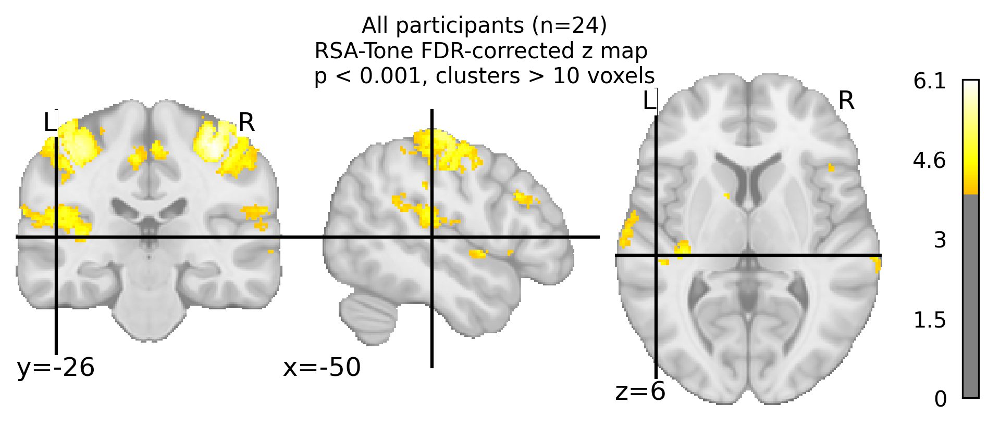

In [61]:
plot_title = ('All participants (n=%d)\n'
              'RSA-%s FDR-corrected z map \n'
              'p < %.04g, clusters > %d voxels'%(len(sub_list_mand+sub_list_nman), model_label, alpha, cthresh))

fig, ax = plt.subplots(figsize=(8,3), dpi=300)

plotting.plot_stat_map(
    thresholded_map, 
    threshold=zthresh,
    bg_img=mni152_template,
    black_bg=False,
    cut_coords=[-50, -26, 6],
    #display_mode='mosaic',
    #title=plot_title,
    axes=ax)
fig.suptitle(plot_title, fontsize=10);
print('The %s=%.3g threshold is %.3g' %(cluster_correct, alpha, zthresh))
#fig.savefig(os.path.join(l2_dir,
#                         f'group-{group_label}_mvpc-searchlight_searchmm-{search_radmm}_fwhm-{fwhm:02f}_alpha-{alpha}_correct-{cluster_correct}_cthresh-{cthresh}_map-zstat.png'))

/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/numpy/core/fromnumeric.py:758: UserWarning: Warning: 'partition' will ignore the 'mask' of the MaskedArray.
  a.partition(kth, axis=axis, kind=kind, order=order)
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/plotting/html_document.py:59: UserWarning: It seems you have created more than 10 nilearn views. As each view uses dozens of megabytes of RAM, you might want to delete some of them.
  warnings.warn('It seems you have created more than {} '



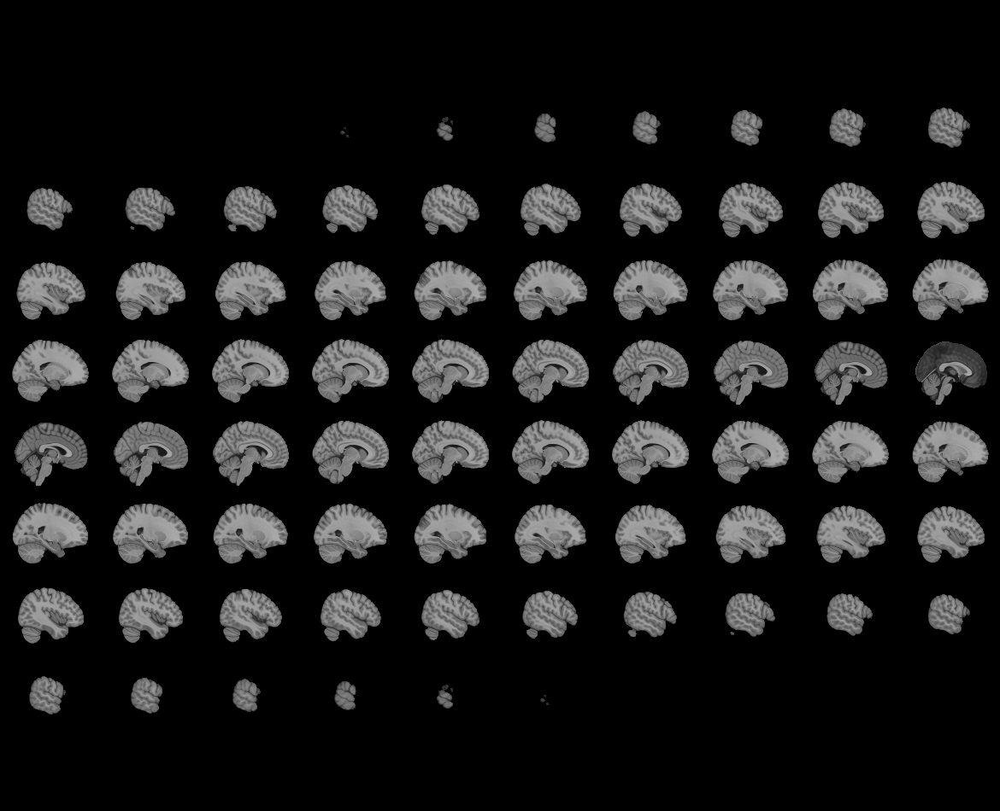
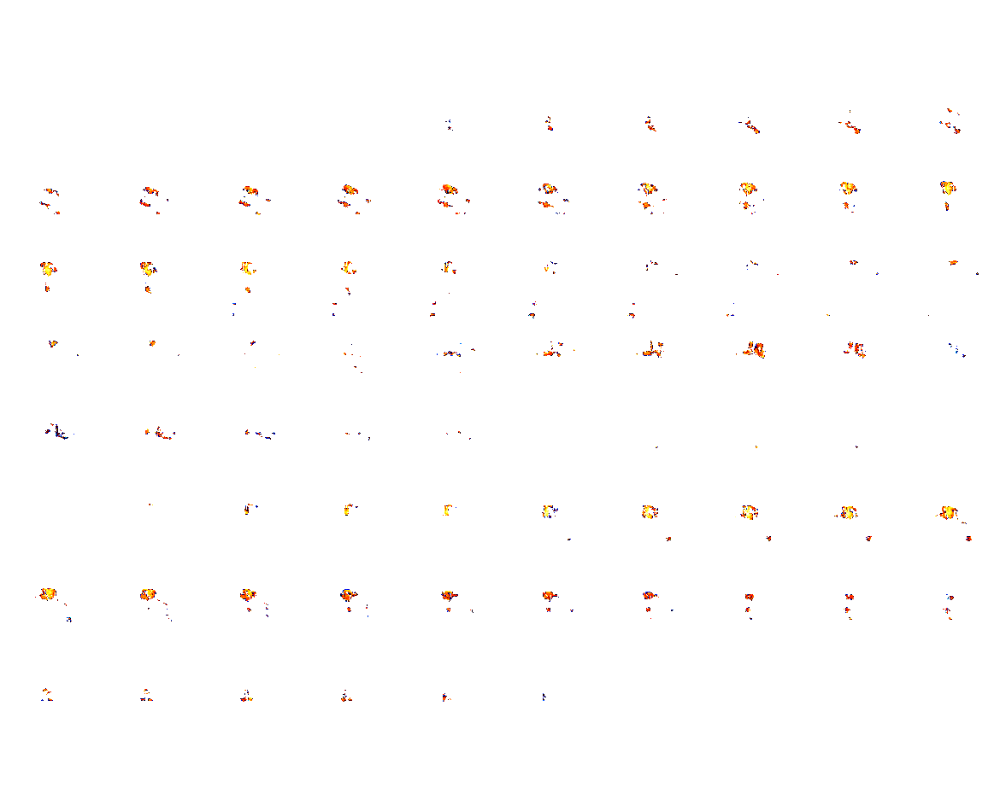

In [60]:
plotting.view_img(thresholded_map,
                  threshold=zthresh,
                  symmetric_cmap=False,
                  title='p < %.04g, clusters > %d voxels'%(alpha, cthresh))

file saved to  /bgfs/bchandrasekaran/krs228/data/FLT/data_denoised/derivatives/nilearn/level-2_fwhm-0.00/group-all_rsa-searchlight_model-Tone_searchrad-5_fwhm-0.0_map-zstat_slice.png


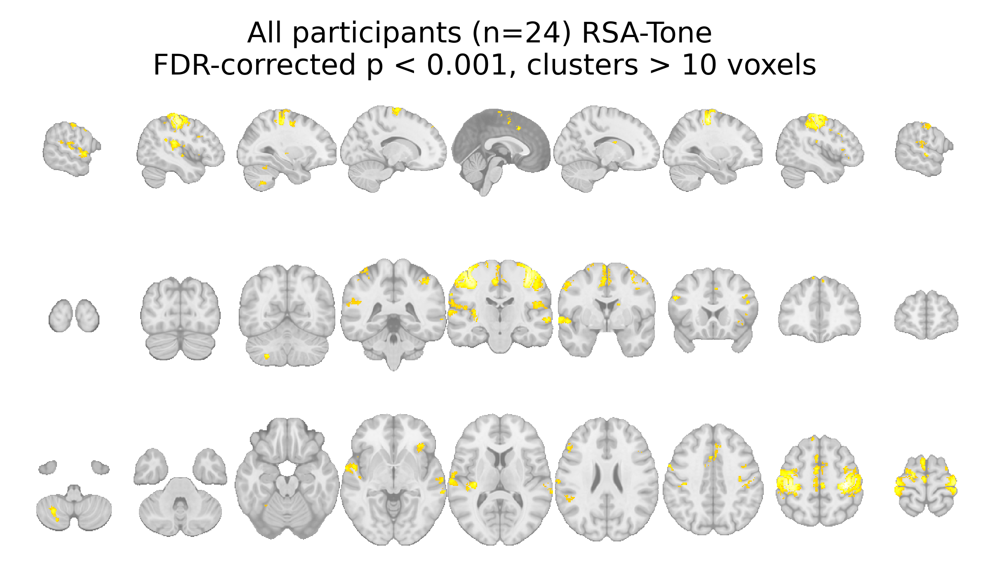

In [62]:
title = ('All participants (n=%d) RSA-%s \n'
         'FDR-corrected p < %.04g, clusters > %d voxels'%(len(sub_list_nman+sub_list_mand), model_label, alpha, cthresh))

#fig = plt.figure(constrained_layout=True, figsize=(8,4), dpi=500)
#subfigs = fig.subfigures(nrows=3, ncols=1)
fig, axes = plt.subplots(3, 1, figsize=(6,3), dpi=500)
fig.suptitle(title, fontsize='medium')

fig_fpath = os.path.join(l2_dir, 
                         f'group-{group_label}_rsa-searchlight_model-{model_label}_searchrad-{searchrad}_fwhm-{fwhm}_map-zstat_slice.png')

plotting.plot_stat_map(thresholded_map, 
                       bg_img=mni152_template, 
                       black_bg=False,
                       display_mode='x',
                       cut_coords=[-60, -45, -30, -15, 0, 15, 30, 45, 60],
                       colorbar=False,
                       annotate=False,
                       #title=title,
                       figure=fig, 
                       axes=axes[0])
plotting.plot_stat_map(thresholded_map, 
                       bg_img=mni152_template, 
                       black_bg=False,
                       display_mode='y',
                       cut_coords=[-100, -80, -60, -40, -20, 0, 20, 40, 60],
                       colorbar=False,
                       annotate=False,
                       #title=title,
                       figure=fig, 
                       axes=axes[1])
plotting.plot_stat_map(thresholded_map, 
                       bg_img=mni152_template, 
                       black_bg=False,
                       display_mode='z',
                       cut_coords=[-50, -35, -20, -5, 10, 25, 40, 55, 70],
                       colorbar=False,
                       annotate=False,
                       #title=title,
                       #figure=fig, 
                       axes=axes[2])

fig.savefig(fig_fpath)
print('file saved to ', fig_fpath)

# Per run group

In [12]:
contrast_label = 'sound'
fwhm = 0.00
searchrad = 5
analysis_label = 'grouped-runs_LSS' #
space_label = 'MNI152NLin2009cAsym'
search_label = f'rsa-searchlight_fwhm-{fwhm:.02f}_searchvox-{searchrad}_{analysis_label}'

l1_dir = os.path.join(bidsroot, 'derivatives', 
                      'nilearn', f'bids-deriv_level-1_fwhm-{fwhm:.02f}')
l2_dir = os.path.join(bidsroot, 'derivatives', 
                      'nilearn', f'bids-deriv_level-2_fwhm-{fwhm:.02f}_{analysis_label}')
os.makedirs(l2_dir, exist_ok=True)

In [13]:
l1_dir

'/bgfs/bchandrasekaran/krs228/data/FLT/data_denoised/derivatives/nilearn/bids-deriv_level-1_fwhm-0.00'

In [14]:
model_list = ['Tone', 'Talker']

model_label = 'Tone'

## Early runs

In [15]:
run_label = 'earlythird'

l1_fnames_groupdiff = [sorted(glob(l1_dir + f'/{sub_id}_space-{space_label}/' +
                                    f'rsa-searchlight_fwhm-{fwhm:.02f}_searchvox-{searchrad}_{analysis_label}/' +
                                    f'{analysis_label}/run-group-{run_label}/' +
                                    f'{sub_id}_run-group-{run_label}_fwhm-{fwhm:.02f}_' +
                                    f'searchvox-{searchrad}_rsa-searchlight_' +
                                    f'contrast-sound_model-{model_label}.nii.gz'
                                   ))[0] for sub_id in subjects_label]

In [16]:
l1_fnames_groupdiff

['/bgfs/bchandrasekaran/krs228/data/FLT/data_denoised/derivatives/nilearn/bids-deriv_level-1_fwhm-0.00/sub-FLT02_space-MNI152NLin2009cAsym/rsa-searchlight_fwhm-0.00_searchvox-5_grouped-runs_LSS/grouped-runs_LSS/run-group-earlythird/sub-FLT02_run-group-earlythird_fwhm-0.00_searchvox-5_rsa-searchlight_contrast-sound_model-Tone.nii.gz',
 '/bgfs/bchandrasekaran/krs228/data/FLT/data_denoised/derivatives/nilearn/bids-deriv_level-1_fwhm-0.00/sub-FLT03_space-MNI152NLin2009cAsym/rsa-searchlight_fwhm-0.00_searchvox-5_grouped-runs_LSS/grouped-runs_LSS/run-group-earlythird/sub-FLT03_run-group-earlythird_fwhm-0.00_searchvox-5_rsa-searchlight_contrast-sound_model-Tone.nii.gz',
 '/bgfs/bchandrasekaran/krs228/data/FLT/data_denoised/derivatives/nilearn/bids-deriv_level-1_fwhm-0.00/sub-FLT04_space-MNI152NLin2009cAsym/rsa-searchlight_fwhm-0.00_searchvox-5_grouped-runs_LSS/grouped-runs_LSS/run-group-earlythird/sub-FLT04_run-group-earlythird_fwhm-0.00_searchvox-5_rsa-searchlight_contrast-sound_model-Tone.n

### Fisher's r-to-z transformation

In [17]:
diff_img_list = []

for sx, sub_sl_fpath in enumerate(l1_fnames_groupdiff):
    
    sub_sl_img = nib.load(sub_sl_fpath)
    sub_sl_data = sub_sl_img.get_fdata()

    # fisher transform r-to-z
    diff_data = np.arctanh(sub_sl_data)

    diff_img = new_img_like(sub_sl_img, diff_data)

    diff_img_list.append(diff_img)

### Group RSA searchlight

In [18]:
#second_level_model = SecondLevelModel().fit(smoothed_l1_fnames_groupdiff, design_matrix=design_mat_groupdiff)
second_level_model = SecondLevelModel().fit(diff_img_list, design_matrix=design_mat_groupdiff)

z_early = second_level_model.compute_contrast(second_level_contrast=[0,1,], output_type='z_score')

In [19]:
group_label = 'NMan'
out_fname = f'group-{group_label}_{search_label}_model-{model_label}_map-zstat.nii.gz'
out_fpath = os.path.join(l2_dir, out_fname)
#nib.save(z_map, out_fpath)

In [83]:
alpha = 0.05
cthresh = 10
cluster_correct =  None # 'fdr', None

thresholded_z_early, z_early_thresh = threshold_stats_img(
                            z_early,
                            alpha=alpha,
                            height_control=cluster_correct,
                            cluster_threshold=cthresh,
                            two_sided=True,
                        )

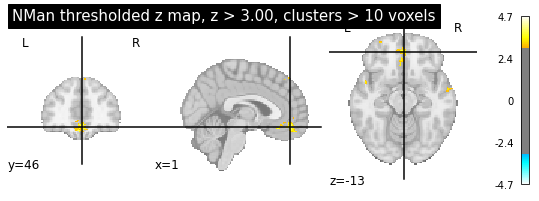

In [84]:
plotting.plot_stat_map(
    thresholded_z_early, #cut_coords=[17,12,5], 
    threshold=z_early_thresh,
    title='%s thresholded z map, z > %.02f, clusters > %d voxels'%(group_label, z_early_thresh, cthresh))

/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/plotting/js_plotting_utils.py:76: UserWarning: you have specified symmetric_cmap=False but the map contains negative values; setting symmetric_cmap to True
  warnings.warn('you have specified symmetric_cmap=False '
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/numpy/core/fromnumeric.py:758: UserWarning: Warning: 'partition' will ignore the 'mask' of the MaskedArray.
  a.partition(kth, axis=axis, kind=kind, order=order)
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/plotting/html_document.py:59: UserWarning: It seems you have created more than 10 nilearn views. As each view uses dozens of megabytes of RAM, you might want to delete some of them.
  warnings.warn('It seems you have created more than {} '



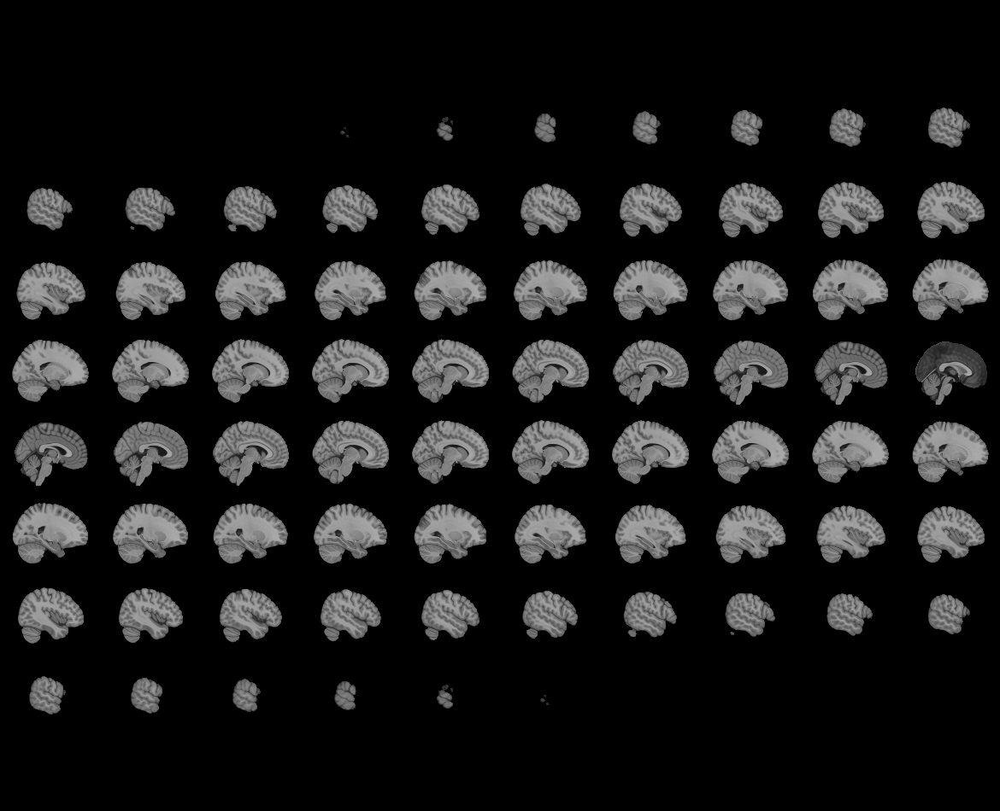
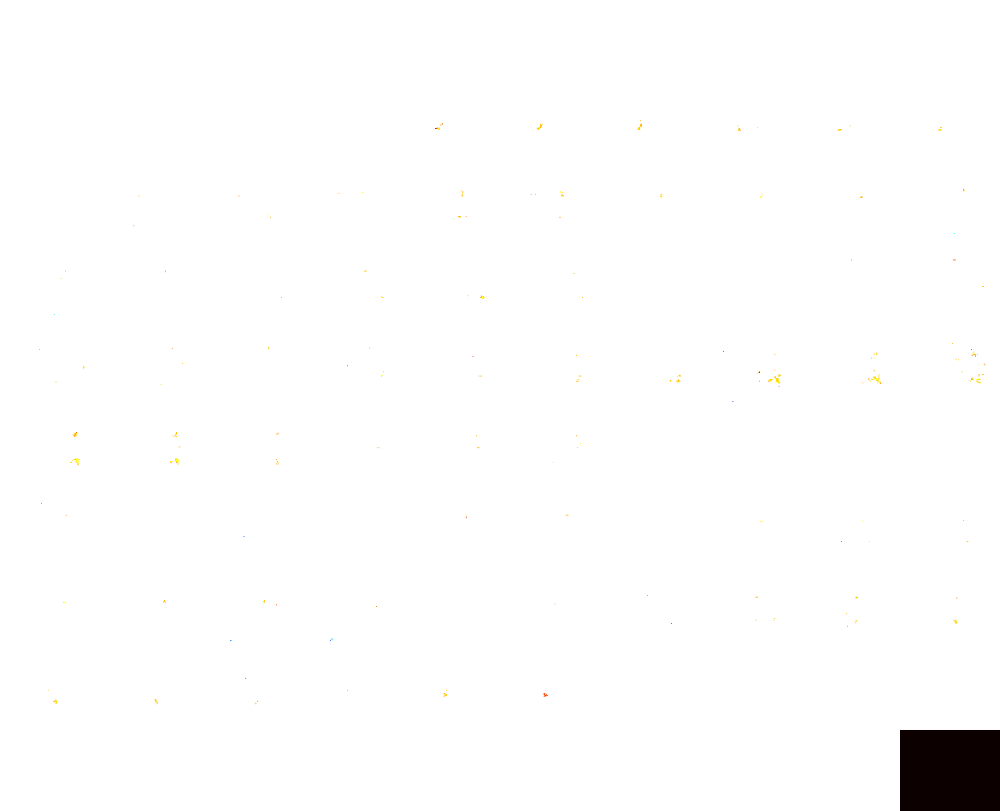

In [85]:
plotting.view_img(z_early,
                  threshold=z_early_thresh,
                  symmetric_cmap=False,
                  title='Early learning stage')

## Middle runs

In [24]:
run_label = 'middlethird'

l1_fnames_groupdiff = [sorted(glob(l1_dir + f'/{sub_id}_space-{space_label}/' +
                                    f'rsa-searchlight_fwhm-{fwhm:.02f}_searchvox-{searchrad}_{analysis_label}/' +
                                    f'{analysis_label}/run-group-{run_label}/' +
                                    f'{sub_id}_run-group-{run_label}_fwhm-{fwhm:.02f}_' +
                                    f'searchvox-{searchrad}_rsa-searchlight_' +
                                    f'contrast-sound_model-{model_label}.nii.gz'
                                   ))[0] for sub_id in subjects_label]

### Fisher's r-to-z transformation

In [25]:
diff_img_list = []

for sx, sub_sl_fpath in enumerate(l1_fnames_groupdiff):
    
    sub_sl_img = nib.load(sub_sl_fpath)
    sub_sl_data = sub_sl_img.get_fdata()

    # fisher transform r-to-z
    diff_data = np.arctanh(sub_sl_data)

    diff_img = new_img_like(sub_sl_img, diff_data)

    diff_img_list.append(diff_img)

### Group RSA searchlight

In [26]:
#second_level_model = SecondLevelModel().fit(smoothed_l1_fnames_groupdiff, design_matrix=design_mat_groupdiff)
second_level_model = SecondLevelModel().fit(diff_img_list, design_matrix=design_mat_groupdiff)

z_middle = second_level_model.compute_contrast(second_level_contrast=[0,1,], output_type='z_score')

In [27]:
group_label = 'NMan'
out_fname = f'group-{group_label}_{search_label}_model-{model_label}_map-zstat.nii.gz'
out_fpath = os.path.join(l2_dir, out_fname)
#nib.save(z_map, out_fpath)

In [77]:
alpha = 0.05
cthresh = 10
cluster_correct =  'fdr' # 'fdr', None

thresholded_z_middle, z_middle_thresh = threshold_stats_img(
                            z_middle,
                            alpha=alpha,
                            height_control=cluster_correct,
                            cluster_threshold=cthresh,
                            two_sided=True,
                        )

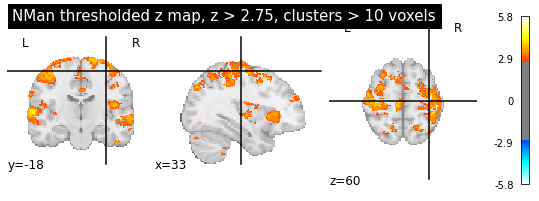

In [78]:
plotting.plot_stat_map(
    thresholded_z_middle, #cut_coords=[17,12,5], 
    threshold=z_middle_thresh,
    title='%s thresholded z map, z > %.02f, clusters > %d voxels'%(group_label, z_middle_thresh, cthresh))

/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/plotting/js_plotting_utils.py:76: UserWarning: you have specified symmetric_cmap=False but the map contains negative values; setting symmetric_cmap to True
  warnings.warn('you have specified symmetric_cmap=False '
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/numpy/core/fromnumeric.py:758: UserWarning: Warning: 'partition' will ignore the 'mask' of the MaskedArray.
  a.partition(kth, axis=axis, kind=kind, order=order)
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/plotting/html_document.py:59: UserWarning: It seems you have created more than 10 nilearn views. As each view uses dozens of megabytes of RAM, you might want to delete some of them.
  warnings.warn('It seems you have created more than {} '



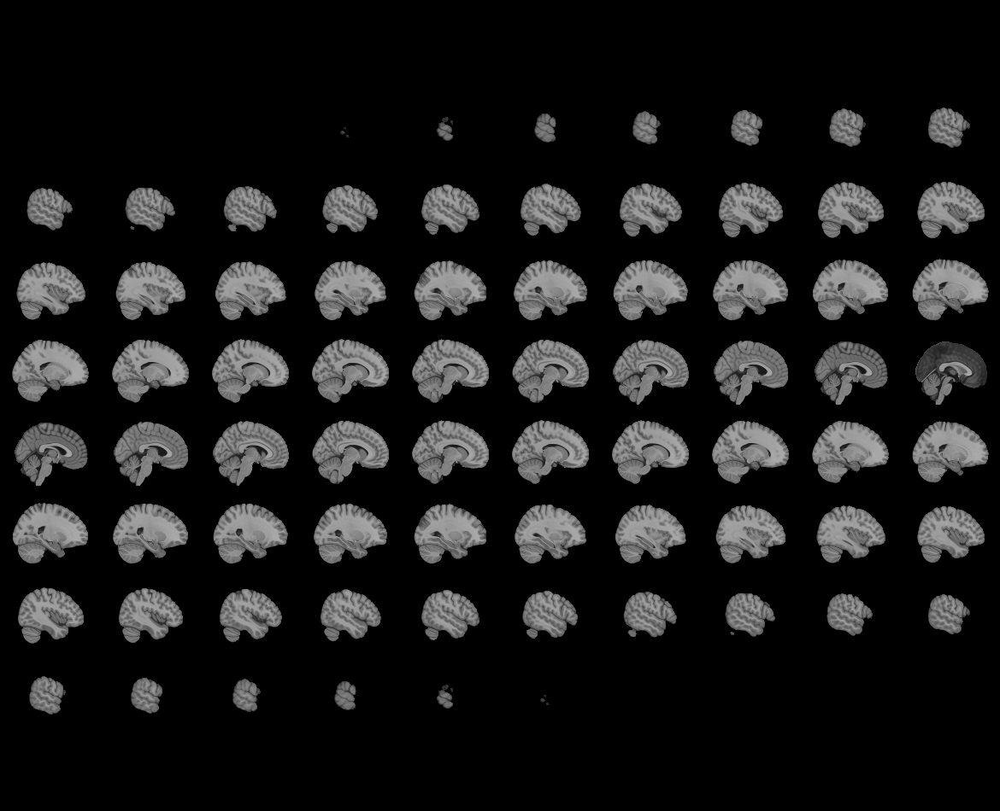
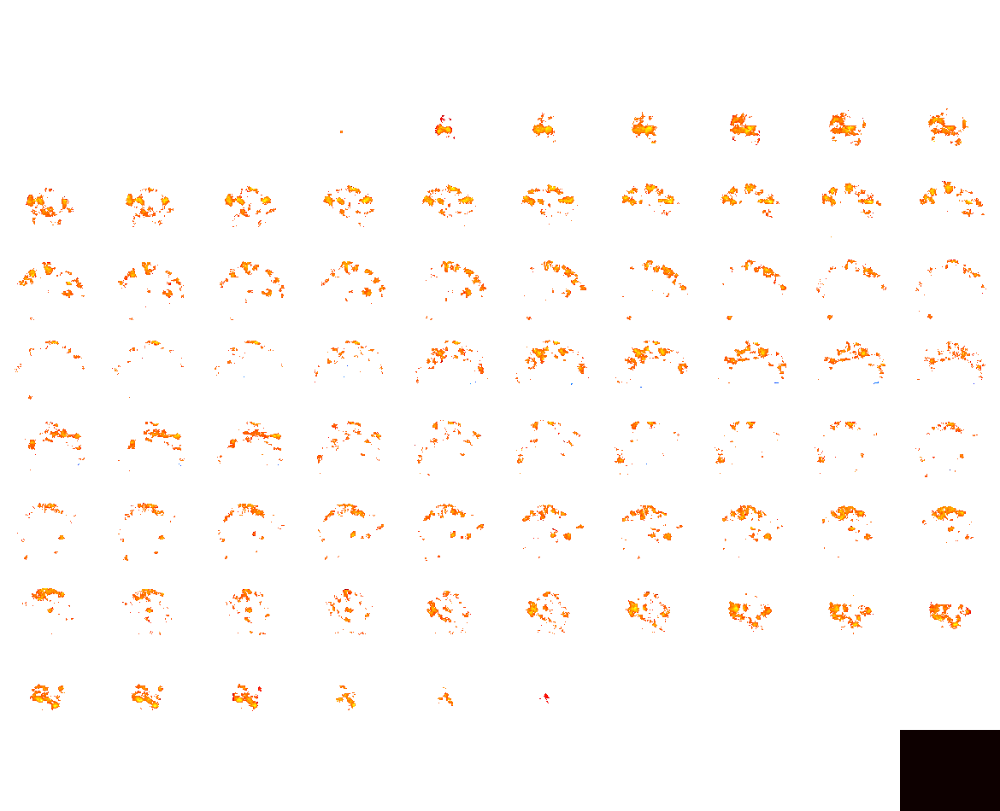

In [79]:
plotting.view_img(z_middle,
                  threshold=z_middle_thresh,
                  symmetric_cmap=False,
                  title='Middle learning stage')

## Final runs

In [32]:
run_label = 'latethird'

l1_fnames_groupdiff = [sorted(glob(l1_dir + f'/{sub_id}_space-{space_label}/' +
                                    f'rsa-searchlight_fwhm-{fwhm:.02f}_searchvox-{searchrad}_{analysis_label}/' +
                                    f'{analysis_label}/run-group-{run_label}/' +
                                    f'{sub_id}_run-group-{run_label}_fwhm-{fwhm:.02f}_' +
                                    f'searchvox-{searchrad}_rsa-searchlight_' +
                                    f'contrast-sound_model-{model_label}.nii.gz'
                                   ))[0] for sub_id in subjects_label]

### Fisher's r-to-z transformation

In [33]:
diff_img_list = []

for sx, sub_sl_fpath in enumerate(l1_fnames_groupdiff):
    
    sub_sl_img = nib.load(sub_sl_fpath)
    sub_sl_data = sub_sl_img.get_fdata()

    # fisher transform r-to-z
    diff_data = np.arctanh(sub_sl_data)

    diff_img = new_img_like(sub_sl_img, diff_data)

    diff_img_list.append(diff_img)

### Group RSA searchlight

In [34]:
#second_level_model = SecondLevelModel().fit(smoothed_l1_fnames_groupdiff, design_matrix=design_mat_groupdiff)
second_level_model = SecondLevelModel().fit(diff_img_list, design_matrix=design_mat_groupdiff)

z_late = second_level_model.compute_contrast(second_level_contrast=[0,1,], output_type='z_score')

In [35]:
group_label = 'NMan'
out_fname = f'group-{group_label}_{search_label}_model-{model_label}_map-zstat.nii.gz'
out_fpath = os.path.join(l2_dir, out_fname)
#nib.save(z_map, out_fpath)

In [86]:
alpha = 0.05
cthresh = 10
cluster_correct =  'fdr' # 'fdr', None

thresholded_z_late, z_late_thresh = threshold_stats_img(
                            z_late,
                            alpha=alpha,
                            height_control=cluster_correct,
                            cluster_threshold=cthresh,
                            two_sided=True,
                        )

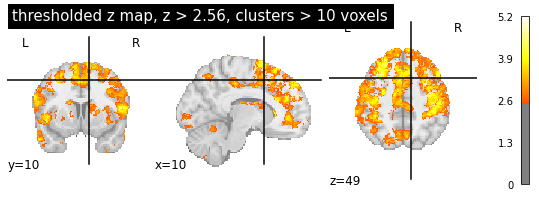

In [87]:
plotting.plot_stat_map(
    thresholded_z_late, #cut_coords=[17,12,5], 
    threshold=z_late_thresh,
    title='thresholded z map, z > %.02f, clusters > %d voxels'%(z_late_thresh, cthresh))

/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/numpy/core/fromnumeric.py:758: UserWarning: Warning: 'partition' will ignore the 'mask' of the MaskedArray.
  a.partition(kth, axis=axis, kind=kind, order=order)
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/plotting/html_document.py:59: UserWarning: It seems you have created more than 10 nilearn views. As each view uses dozens of megabytes of RAM, you might want to delete some of them.
  warnings.warn('It seems you have created more than {} '



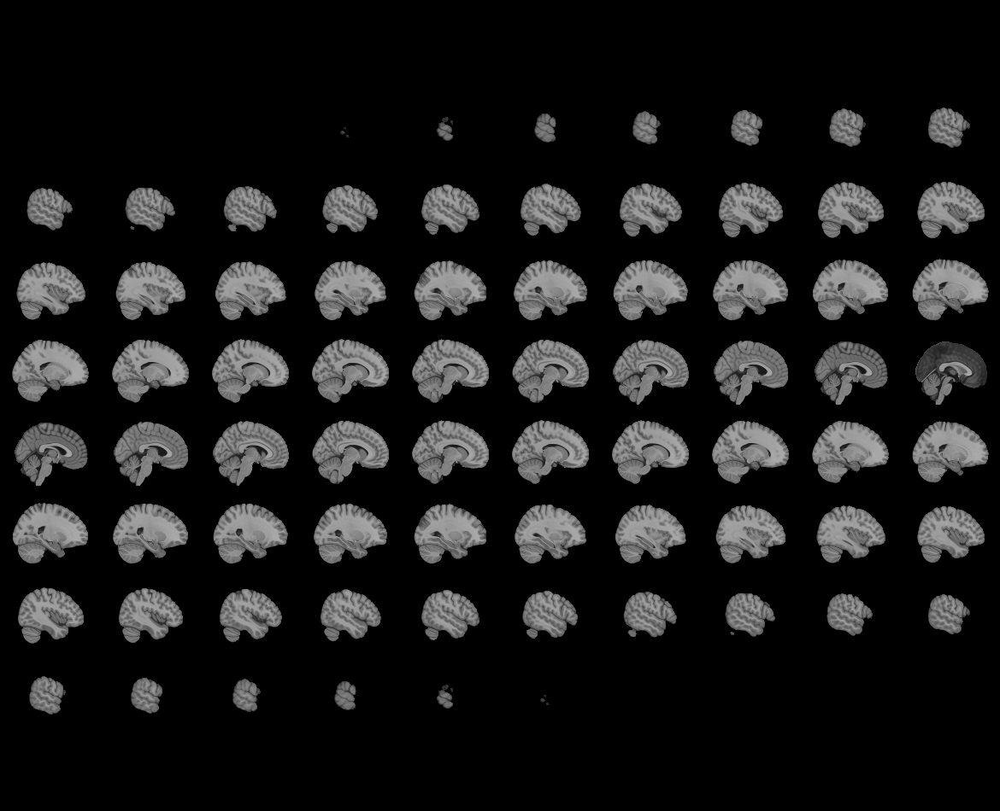
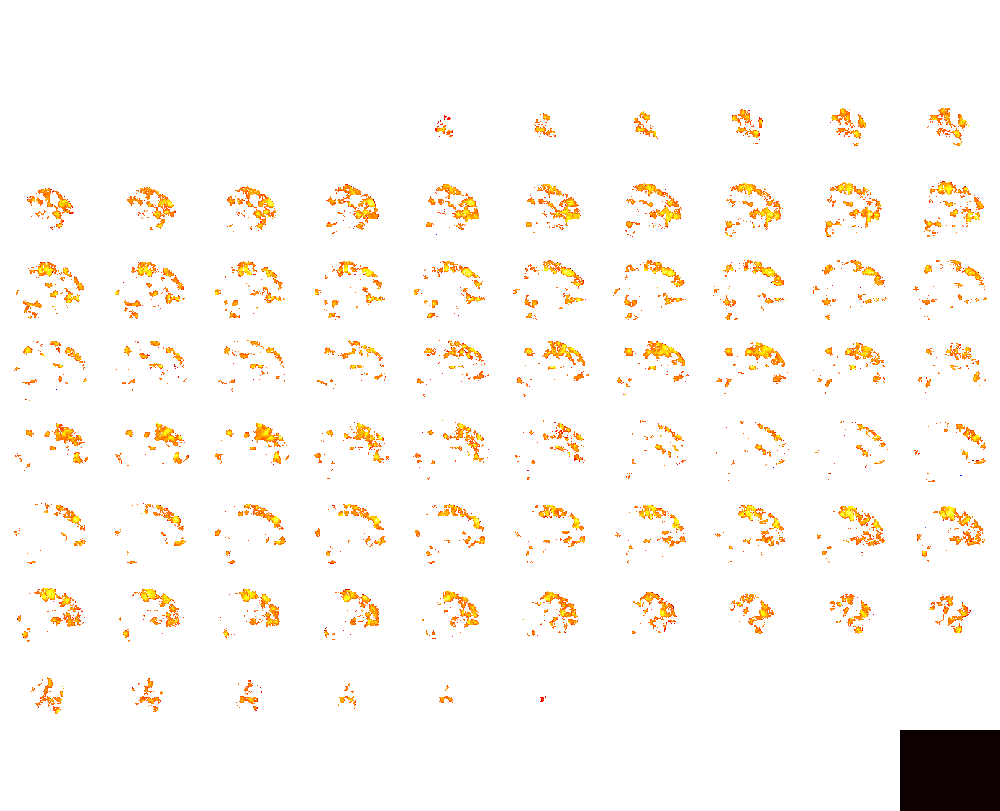

In [89]:
plotting.view_img(z_late,
                  threshold=z_late_thresh,
                  symmetric_cmap=True,
                  title='Final learning stage')

# Comparing run groups

### Create design matrix

In [39]:
sub_list_mand

['sub-FLT03',
 'sub-FLT05',
 'sub-FLT08',
 'sub-FLT10',
 'sub-FLT17',
 'sub-FLT18',
 'sub-FLT19',
 'sub-FLT21',
 'sub-FLT22',
 'sub-FLT23',
 'sub-FLT24',
 'sub-FLT26']

In [40]:
len(sub_list_mand)

12

In [41]:
hst0 = np.hstack((np.ones(len(sub_list_nman)), np.zeros(len(sub_list_nman))))
hst1 = np.hstack((np.zeros(len(sub_list_nman)),np.ones(len(sub_list_nman))))

In [42]:
# Create DataFrame
comp_df = pd.DataFrame({
    'hst0': hst0,
    'hst1': hst1
})

# Display the DataFrame
print(comp_df)

    hst0  hst1
0    1.0   0.0
1    1.0   0.0
2    1.0   0.0
3    1.0   0.0
4    1.0   0.0
5    1.0   0.0
6    1.0   0.0
7    1.0   0.0
8    1.0   0.0
9    1.0   0.0
10   1.0   0.0
11   1.0   0.0
12   0.0   1.0
13   0.0   1.0
14   0.0   1.0
15   0.0   1.0
16   0.0   1.0
17   0.0   1.0
18   0.0   1.0
19   0.0   1.0
20   0.0   1.0
21   0.0   1.0
22   0.0   1.0
23   0.0   1.0


### Load files and Fisher-transform

In [43]:
run_label = 'earlythird'

l1_fnames_early = [sorted(glob(l1_dir + f'/{sub_id}_space-{space_label}/' +
                                    f'rsa-searchlight_fwhm-{fwhm:.02f}_searchvox-{searchrad}_{analysis_label}/' +
                                    f'{analysis_label}/run-group-{run_label}/' +
                                    f'{sub_id}_run-group-{run_label}_fwhm-{fwhm:.02f}_' +
                                    f'searchvox-{searchrad}_rsa-searchlight_' +
                                    f'contrast-sound_model-{model_label}.nii.gz'
                                   ))[0] for sub_id in sub_list_nman]

In [44]:
early_img_list = []

for sx, sub_sl_fpath in enumerate(l1_fnames_early):
    
    sub_sl_img = nib.load(sub_sl_fpath)
    sub_sl_data = sub_sl_img.get_fdata()

    # fisher transform r-to-z
    diff_data = np.arctanh(sub_sl_data)

    diff_img = new_img_like(sub_sl_img, diff_data)

    early_img_list.append(diff_img)

In [45]:
run_label = 'middlethird'

l1_fnames_middle = [sorted(glob(l1_dir + f'/{sub_id}_space-{space_label}/' +
                                    f'rsa-searchlight_fwhm-{fwhm:.02f}_searchvox-{searchrad}_{analysis_label}/' +
                                    f'{analysis_label}/run-group-{run_label}/' +
                                    f'{sub_id}_run-group-{run_label}_fwhm-{fwhm:.02f}_' +
                                    f'searchvox-{searchrad}_rsa-searchlight_' +
                                    f'contrast-sound_model-{model_label}.nii.gz'
                                   ))[0] for sub_id in sub_list_nman]

In [46]:
middle_img_list = []

for sx, sub_sl_fpath in enumerate(l1_fnames_middle):
    
    sub_sl_img = nib.load(sub_sl_fpath)
    sub_sl_data = sub_sl_img.get_fdata()

    # fisher transform r-to-z
    diff_data = np.arctanh(sub_sl_data)

    diff_img = new_img_like(sub_sl_img, diff_data)

    middle_img_list.append(diff_img)

In [47]:
run_label = 'latethird'

l1_fnames_late = [sorted(glob(l1_dir + f'/{sub_id}_space-{space_label}/' +
                                    f'rsa-searchlight_fwhm-{fwhm:.02f}_searchvox-{searchrad}_{analysis_label}/' +
                                    f'{analysis_label}/run-group-{run_label}/' +
                                    f'{sub_id}_run-group-{run_label}_fwhm-{fwhm:.02f}_' +
                                    f'searchvox-{searchrad}_rsa-searchlight_' +
                                    f'contrast-sound_model-{model_label}.nii.gz'
                                   ))[0] for sub_id in sub_list_nman]

In [48]:
late_img_list = []

for sx, sub_sl_fpath in enumerate(l1_fnames_late):
    
    sub_sl_img = nib.load(sub_sl_fpath)
    sub_sl_data = sub_sl_img.get_fdata()

    # fisher transform r-to-z
    diff_data = np.arctanh(sub_sl_data)

    diff_img = new_img_like(sub_sl_img, diff_data)

    late_img_list.append(diff_img)

## Early vs. Middle

In [49]:
allcomp_list = early_img_list + middle_img_list

In [50]:
len(allcomp_list)

24

In [51]:
second_level_model = SecondLevelModel().fit(allcomp_list, design_matrix=comp_df)

group_comp = second_level_model.compute_contrast(second_level_contrast=[-1, 1], output_type='z_score')

In [52]:
alpha = 0.05
cthresh = 10
cluster_correct =  None #'fdr', None

thresholded_z_comp, z_comp_thresh = threshold_stats_img(
                            group_comp,
                            alpha=alpha,
                            height_control=cluster_correct,
                            cluster_threshold=cthresh,
                            two_sided=True,
    
                        )

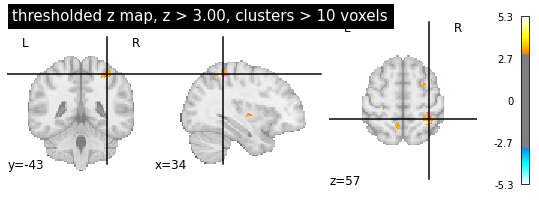

In [53]:
plotting.plot_stat_map(
    thresholded_z_comp, #cut_coords=[17,12,5], 
    threshold=z_comp_thresh,
    title='thresholded z map, z > %.02f, clusters > %d voxels'%(z_comp_thresh, cthresh))

/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/numpy/core/fromnumeric.py:758: UserWarning: Warning: 'partition' will ignore the 'mask' of the MaskedArray.
  a.partition(kth, axis=axis, kind=kind, order=order)



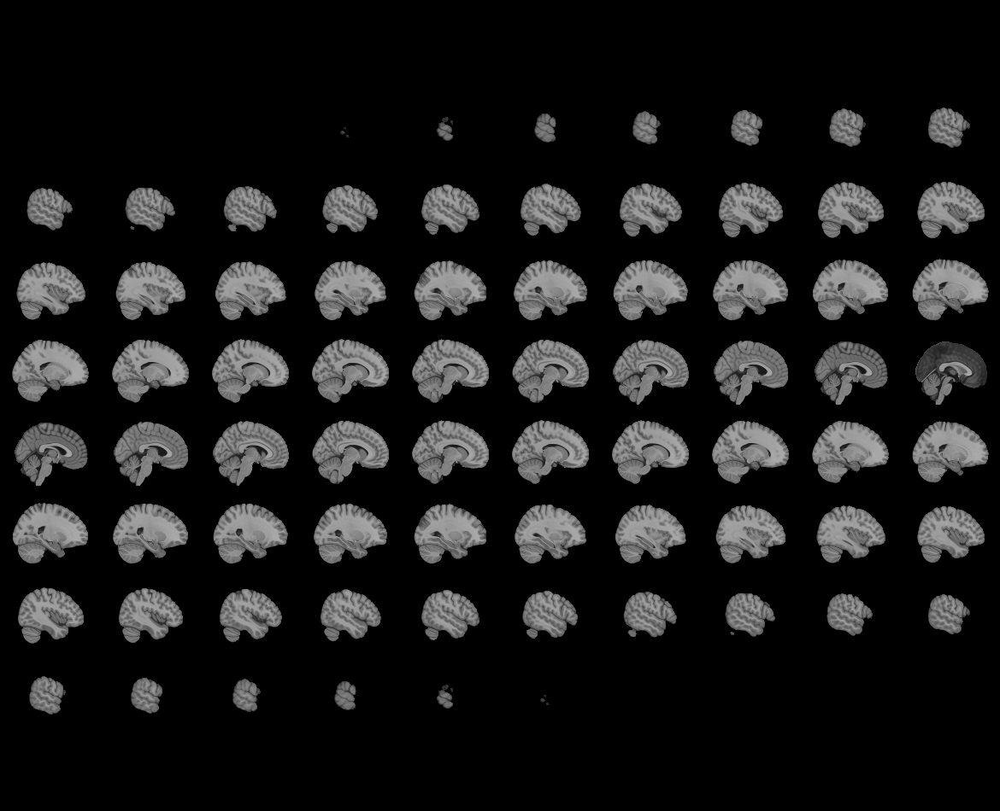
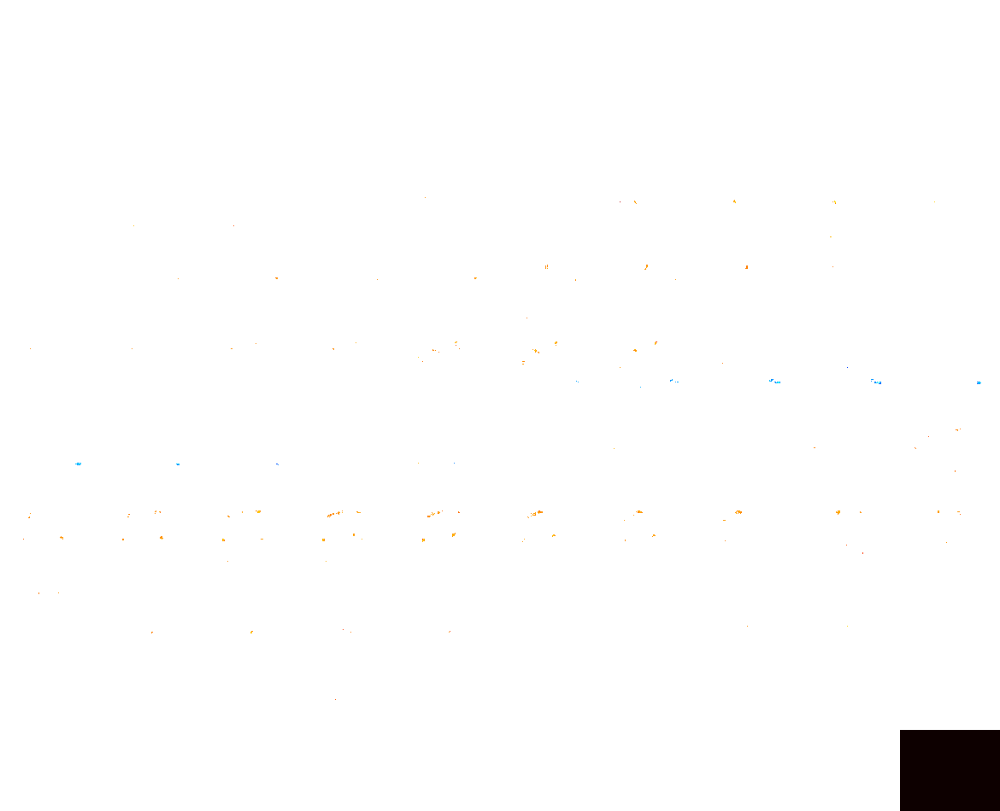

In [55]:
plotting.view_img(group_comp,
                  threshold=z_comp_thresh, # z_comp_thresh, 2
                  symmetric_cmap=True,
                  title='early (cool) vs. middle (hot)')

## Early vs. Late

In [56]:
allcomp_list = early_img_list + late_img_list

In [57]:
len(allcomp_list)

24

In [58]:
second_level_model = SecondLevelModel().fit(allcomp_list, design_matrix=comp_df)

group_comp = second_level_model.compute_contrast(second_level_contrast=[-1, 1], output_type='z_score')

In [59]:
alpha = 0.05
cthresh = 10
cluster_correct =  None #'fdr', None

thresholded_z_comp, z_comp_thresh = threshold_stats_img(
                            group_comp,
                            alpha=alpha,
                            height_control=cluster_correct,
                            cluster_threshold=cthresh,
                            two_sided=True,
    
                        )

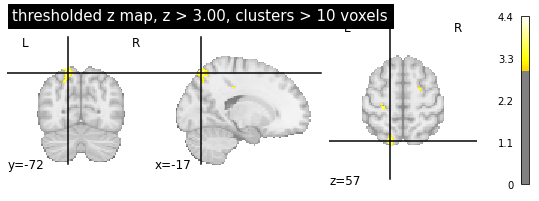

In [60]:
plotting.plot_stat_map(
    thresholded_z_comp, #cut_coords=[17,12,5], 
    threshold=z_comp_thresh,
    title='thresholded z map, z > %.02f, clusters > %d voxels'%(z_comp_thresh, cthresh))

/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/numpy/core/fromnumeric.py:758: UserWarning: Warning: 'partition' will ignore the 'mask' of the MaskedArray.
  a.partition(kth, axis=axis, kind=kind, order=order)



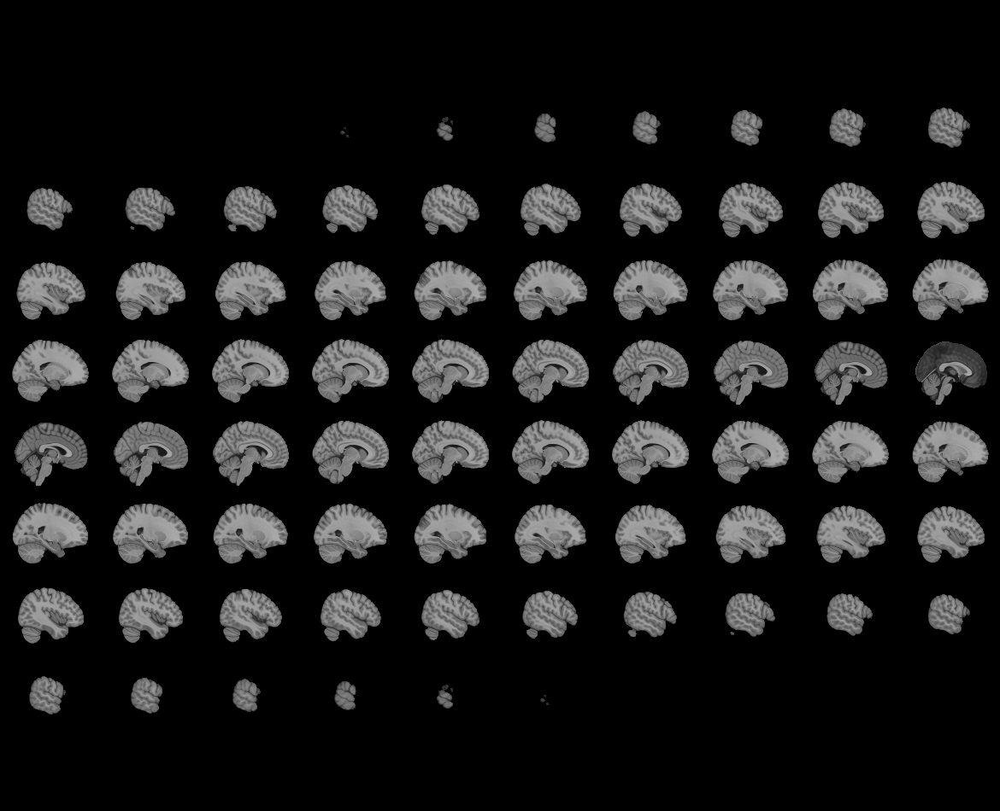
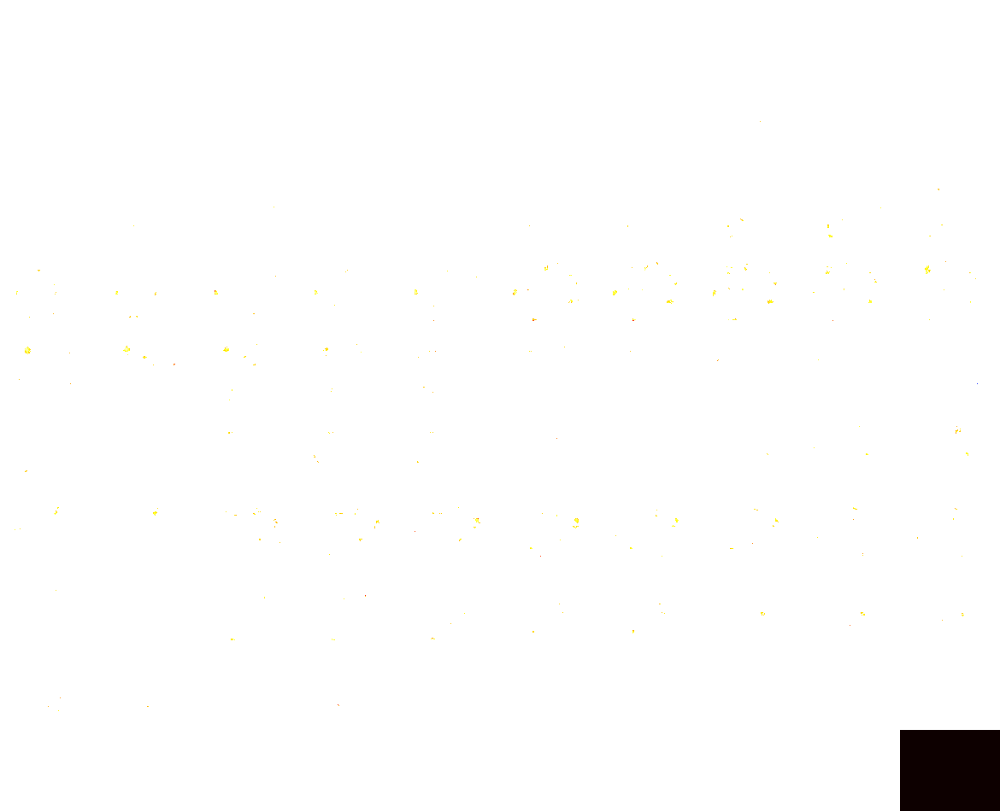

In [61]:
plotting.view_img(group_comp,
                  threshold=z_comp_thresh, # z_comp_thresh, 2
                  symmetric_cmap=True,
                  title='early (cool) vs. late (hot)')

## Middle vs. Late

In [62]:
allcomp_list = middle_img_list + late_img_list

In [63]:
len(allcomp_list)

24

In [64]:
second_level_model = SecondLevelModel().fit(allcomp_list, design_matrix=comp_df)

group_comp = second_level_model.compute_contrast(second_level_contrast=[-1, 1], output_type='z_score')

In [65]:
alpha = 0.05
cthresh = 10
cluster_correct =  None #'fdr', None

thresholded_z_comp, z_comp_thresh = threshold_stats_img(
                            group_comp,
                            alpha=alpha,
                            height_control=cluster_correct,
                            cluster_threshold=cthresh,
                            two_sided=True,
    
                        )

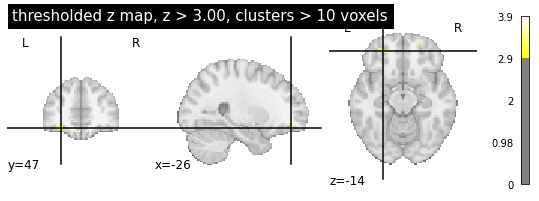

In [66]:
plotting.plot_stat_map(
    thresholded_z_comp, #cut_coords=[17,12,5], 
    threshold=z_comp_thresh,
    title='thresholded z map, z > %.02f, clusters > %d voxels'%(z_comp_thresh, cthresh))

/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/numpy/core/fromnumeric.py:758: UserWarning: Warning: 'partition' will ignore the 'mask' of the MaskedArray.
  a.partition(kth, axis=axis, kind=kind, order=order)



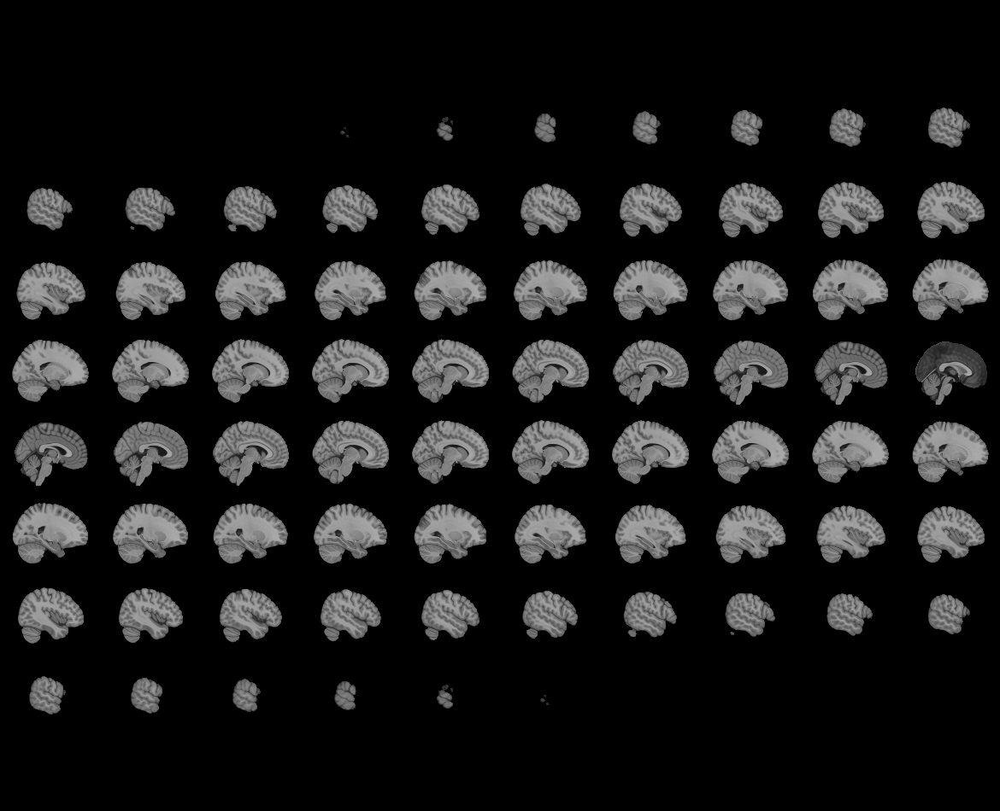
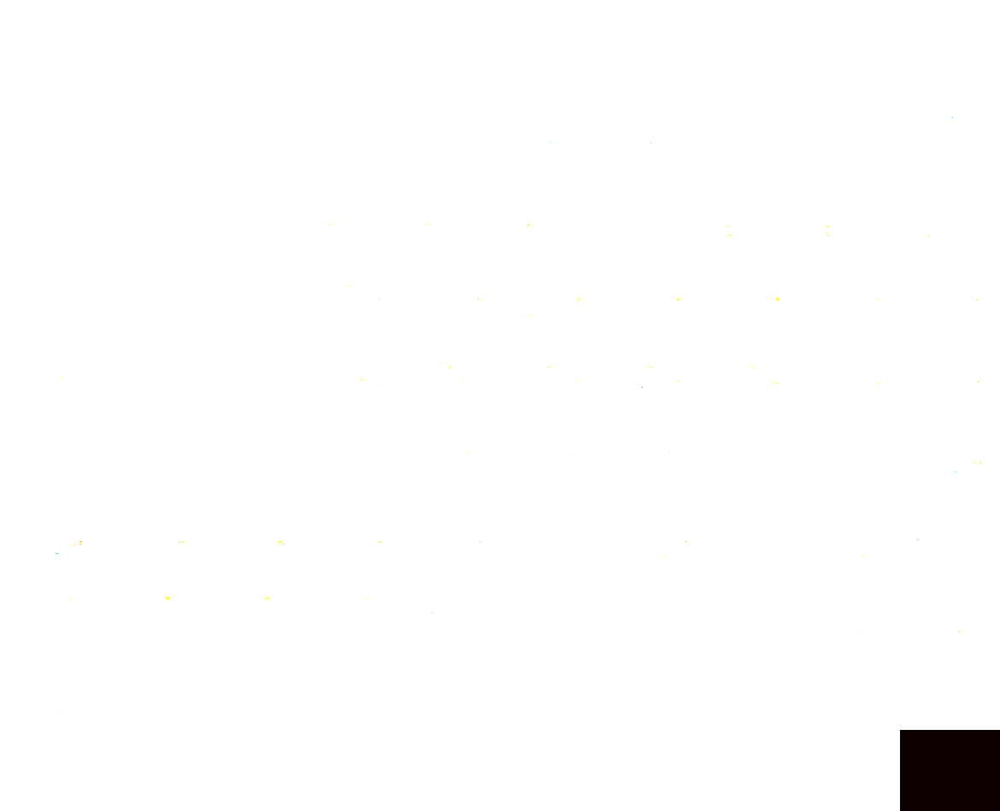

In [67]:
plotting.view_img(group_comp,
                  threshold=z_comp_thresh, # z_comp_thresh, 2
                  symmetric_cmap=True,
                  title='middle (cool) vs. late (hot)')

# Per run

### Get files

In [33]:
contrast_label = 'sound'
fwhm = 0.00
searchrad = 5
analysis_label = 'stimulus_per_run_LSS' #
space_label = 'MNI152NLin2009cAsym'
search_label = f'rsa-searchlight_fwhm-{fwhm:.02f}_searchvox-{searchrad}_{analysis_label}'

l1_dir = os.path.join(bidsroot, 'derivatives', 
                      'nilearn', f'level-1_fwhm-{fwhm:.02f}')
l2_dir = os.path.join(bidsroot, 'derivatives', 
                      'nilearn', f'level-2_fwhm-{fwhm:.02f}_{model_label}')
os.makedirs(l2_dir, exist_ok=True)

In [37]:
l1_dir

'/bgfs/bchandrasekaran/krs228/data/FLT/data_denoised/derivatives/nilearn/level-1_fwhm-0.00'

In [35]:
model_list = ['Tone', 'Talker']

model_label = 'Tone'

In [63]:
run_label = 'run05'

l1_fnames_groupdiff = [sorted(glob(l1_dir+f'/{sub_id}_space-{space_label}/{search_label}/{run_label}/' +
                                   '%s_%s_fwhm-%.02f_searchvox-%d_rsa-searchlight_contrast-%s_model-%s.nii.gz'%(sub_id, run_label, fwhm, searchrad, contrast_label,
                                                                                                 model_label)))[0] for sub_id in subjects_label]

In [64]:
l1_fnames_groupdiff

['/bgfs/bchandrasekaran/krs228/data/FLT/data_denoised/derivatives/nilearn/level-1_fwhm-0.00/sub-FLT02_space-MNI152NLin2009cAsym/rsa-searchlight_fwhm-0.00_searchvox-5_stimulus_per_run_LSS/run05/sub-FLT02_run05_fwhm-0.00_searchvox-5_rsa-searchlight_contrast-sound_model-Tone.nii.gz',
 '/bgfs/bchandrasekaran/krs228/data/FLT/data_denoised/derivatives/nilearn/level-1_fwhm-0.00/sub-FLT03_space-MNI152NLin2009cAsym/rsa-searchlight_fwhm-0.00_searchvox-5_stimulus_per_run_LSS/run05/sub-FLT03_run05_fwhm-0.00_searchvox-5_rsa-searchlight_contrast-sound_model-Tone.nii.gz',
 '/bgfs/bchandrasekaran/krs228/data/FLT/data_denoised/derivatives/nilearn/level-1_fwhm-0.00/sub-FLT04_space-MNI152NLin2009cAsym/rsa-searchlight_fwhm-0.00_searchvox-5_stimulus_per_run_LSS/run05/sub-FLT04_run05_fwhm-0.00_searchvox-5_rsa-searchlight_contrast-sound_model-Tone.nii.gz',
 '/bgfs/bchandrasekaran/krs228/data/FLT/data_denoised/derivatives/nilearn/level-1_fwhm-0.00/sub-FLT05_space-MNI152NLin2009cAsym/rsa-searchlight_fwhm-0.00_

## WIP: fisher's r-to-z transformation

### loop through images and transform

In [65]:
diff_img_list = []

for sx, sub_sl_fpath in enumerate(l1_fnames_groupdiff):
    
    sub_sl_img = nib.load(sub_sl_fpath)
    sub_sl_data = sub_sl_img.get_fdata()

    # fisher transform r-to-z
    diff_data = np.arctanh(sub_sl_data)

    diff_img = new_img_like(sub_sl_img, diff_data)

    diff_img_list.append(diff_img)

### Mandarin-speaking participants group RSA

In [82]:
#second_level_model = SecondLevelModel().fit(smoothed_l1_fnames_groupdiff, design_matrix=design_mat_groupdiff)
second_level_model = SecondLevelModel().fit(diff_img_list, design_matrix=design_mat_groupdiff)

z_map = second_level_model.compute_contrast(second_level_contrast=[1, 0,], output_type='z_score')

In [83]:
group_label = 'Mand'
out_fname = 'group-{}_{}_model-{}_map-zstat.nii.gz'.format(group_label, search_label, model_label)
out_fpath = os.path.join(l2_dir, out_fname)
nib.save(z_map, out_fpath)

In [84]:
print(out_fpath)

/bgfs/bchandrasekaran/krs228/data/FLT/data_denoised/derivatives/nilearn/level-2_fwhm-0.00_Tone/group-Mand_rsa-searchlight_fwhm-0.00_searchvox-5_stimulus_per_run_LSS_model-Tone_map-zstat.nii.gz


In [85]:
from nilearn.image import threshold_img
from nilearn.glm import threshold_stats_img
alpha = 0.01
cthresh = 10
cluster_correct = None # 'fdr'

threshold=2.58

thresholded_map, zthresh = threshold_stats_img(
                            z_map,
                            alpha=alpha,
                            height_control=cluster_correct,
                            cluster_threshold=cthresh,
                            two_sided=False,
                        )

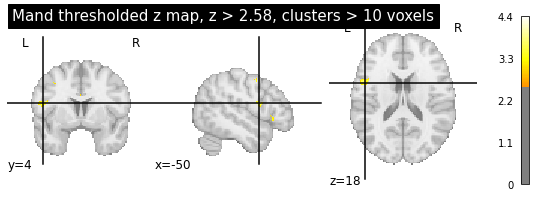

In [86]:
plotting.plot_stat_map(
    thresholded_map, #cut_coords=[17,12,5], 
    threshold=threshold,
    title='%s thresholded z map, z > %.02f, clusters > %d voxels'%(group_label, threshold, cthresh))

/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/numpy/core/fromnumeric.py:758: UserWarning: Warning: 'partition' will ignore the 'mask' of the MaskedArray.
  a.partition(kth, axis=axis, kind=kind, order=order)



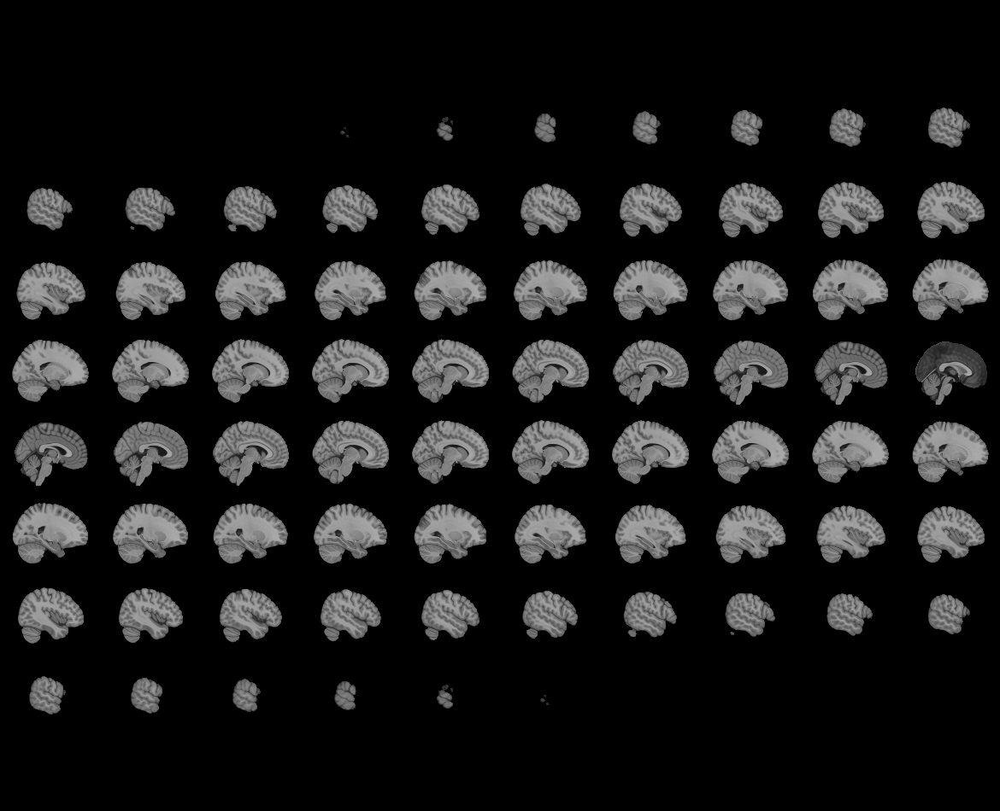
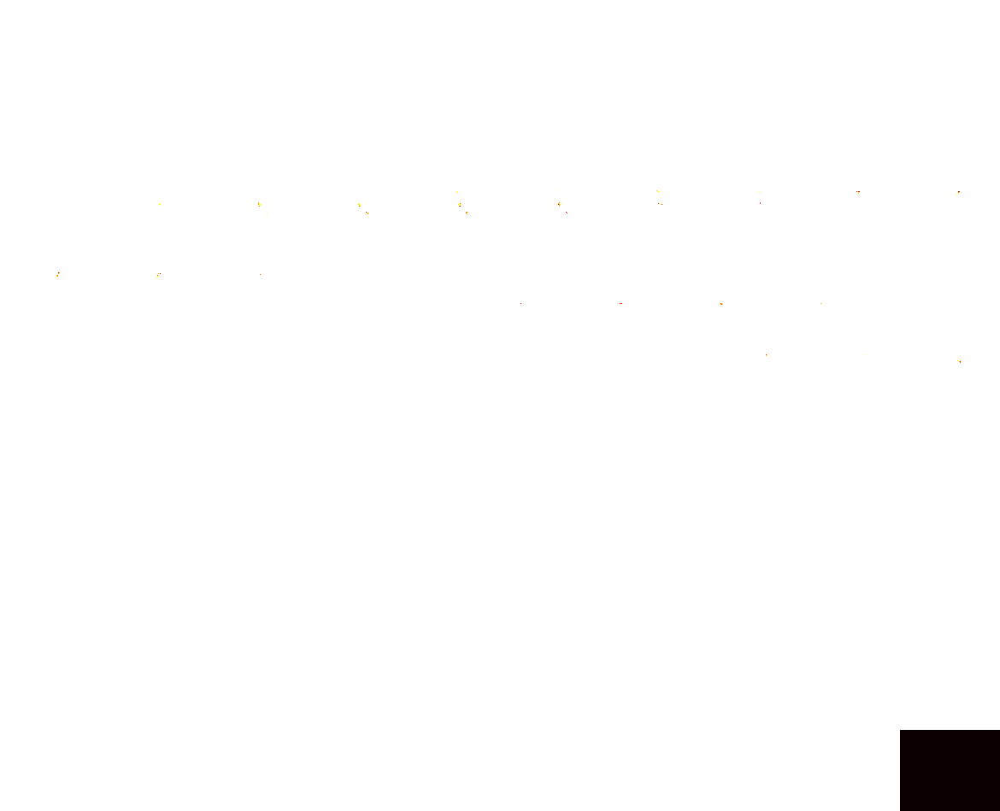

In [87]:
plotting.view_img(thresholded_map,
                  #threshold=threshold,
                  symmetric_cmap=True)

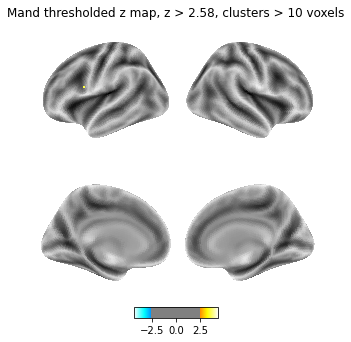

In [72]:
plotting.plot_img_on_surf(thresholded_map,
                          #surf_mesh='fsaverage', # comment out for faster default (fsaverage5)
                          views=['lateral', 'medial'],
                          hemispheres=['left', 'right'],
                          inflate=True,
                          threshold=threshold,
                          #cmap='Reds',
                          colorbar=True,
                          title='%s thresholded z map, z > %.02f, clusters > %d voxels'%(group_label, threshold, cthresh))
plotting.show()

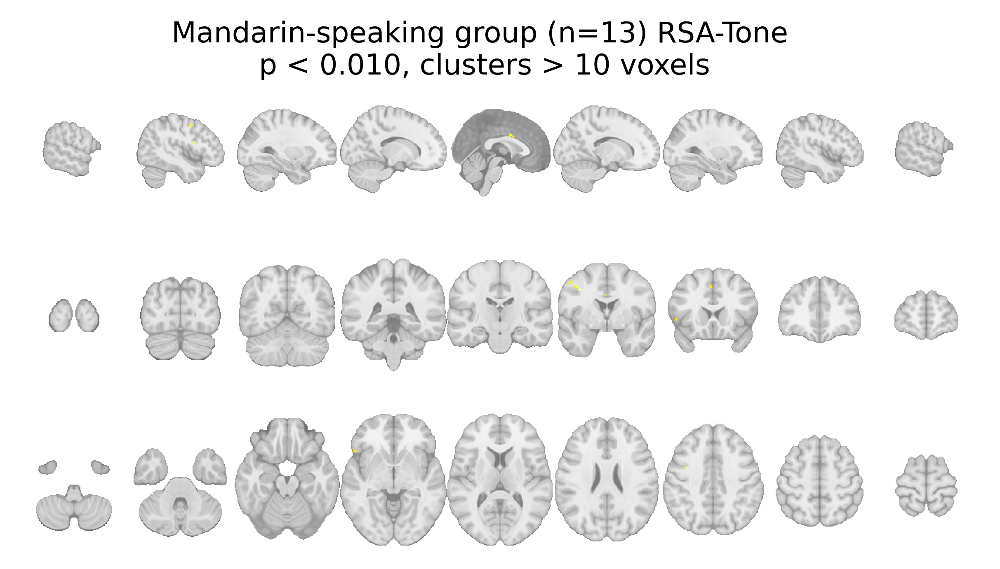

In [73]:
title = ('Mandarin-speaking group (n=%d) RSA-%s \n'
              'p < %.03f, clusters > %d voxels'%(len(sub_list_mand), model_label, alpha, cthresh))

#fig = plt.figure(constrained_layout=True, figsize=(8,4), dpi=500)
#subfigs = fig.subfigures(nrows=3, ncols=1)
fig, axes = plt.subplots(3, 1, figsize=(6,3), dpi=500)
fig.suptitle(title, fontsize='medium')

fig_fpath = os.path.join(l2_dir, 
                         f'group-{group_label}_rsa-searchlight_model-{model_label}_searchrad-{searchrad}_fwhm-{fwhm}_map-zstat_slice.png')

plotting.plot_stat_map(thresholded_map, 
                       bg_img=mni152_template, 
                       black_bg=False,
                       display_mode='x',
                       cut_coords=[-60, -45, -30, -15, 0, 15, 30, 45, 60],
                       colorbar=False,
                       annotate=False,
                       #title=title,
                       figure=fig, 
                       axes=axes[0])
plotting.plot_stat_map(thresholded_map, 
                       bg_img=mni152_template, 
                       black_bg=False,
                       display_mode='y',
                       cut_coords=[-100, -80, -60, -40, -20, 0, 20, 40, 60],
                       colorbar=False,
                       annotate=False,
                       #title=title,
                       figure=fig, 
                       axes=axes[1])
plotting.plot_stat_map(thresholded_map, 
                       bg_img=mni152_template, 
                       black_bg=False,
                       display_mode='z',
                       cut_coords=[-50, -35, -20, -5, 10, 25, 40, 55, 70],
                       colorbar=False,
                       annotate=False,
                       #title=title,
                       #figure=fig, 
                       axes=axes[2])

#fig.savefig(fig_fpath)
#print('file saved to ', fig_fpath)

### Non-Mandarin-speaking participants group RSA

In [74]:
#second_level_model = SecondLevelModel().fit(smoothed_l1_fnames_groupdiff, design_matrix=design_mat_groupdiff)
second_level_model = SecondLevelModel().fit(diff_img_list, design_matrix=design_mat_groupdiff)

z_map = second_level_model.compute_contrast(second_level_contrast=[0,1,], output_type='z_score')

In [75]:
group_label = 'NMan'
out_fname = f'group-{group_label}_{search_label}_model-{model_label}_map-zstat.nii.gz'
out_fpath = os.path.join(l2_dir, out_fname)
nib.save(z_map, out_fpath)

In [76]:
alpha = 0.001
cthresh = 10
cluster_correct =  'fdr' # None

thresholded_map, zthresh = threshold_stats_img(
                            z_map,
                            alpha=alpha,
                            height_control=cluster_correct,
                            cluster_threshold=cthresh,
                            two_sided=False,
                        )

/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/_utils/param_validation.py:72: UserWarning: The given float value must not exceed 4.8102802225805625. But, you have given threshold=inf 
  warnings.warn("The given float value must not exceed {0}. "


/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/plotting/find_cuts.py:69: UserWarning: Given img is empty. Returning default cut_coords=(0.0, 0.0, 0.0) instead.
  warnings.warn(
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/plotting/displays/_slicers.py:382: UserWarning: empty mask
  get_mask_bounds(new_img_like(img, not_mask, affine))


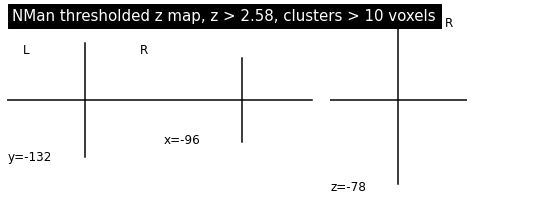

In [77]:
plotting.plot_stat_map(
    thresholded_map, #cut_coords=[17,12,5], 
    threshold=zthresh,
    title='%s thresholded z map, z > %.02f, clusters > %d voxels'%(group_label, threshold, cthresh))

/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/_utils/param_validation.py:72: UserWarning: The given float value must not exceed 0.0. But, you have given threshold=inf 
  warnings.warn("The given float value must not exceed {0}. "
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/numpy/core/fromnumeric.py:758: UserWarning: Warning: 'partition' will ignore the 'mask' of the MaskedArray.
  a.partition(kth, axis=axis, kind=kind, order=order)
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/plotting/find_cuts.py:69: UserWarning: Given img is empty. Returning default cut_coords=(0.0, 0.0, 0.0) instead.
  warnings.warn(



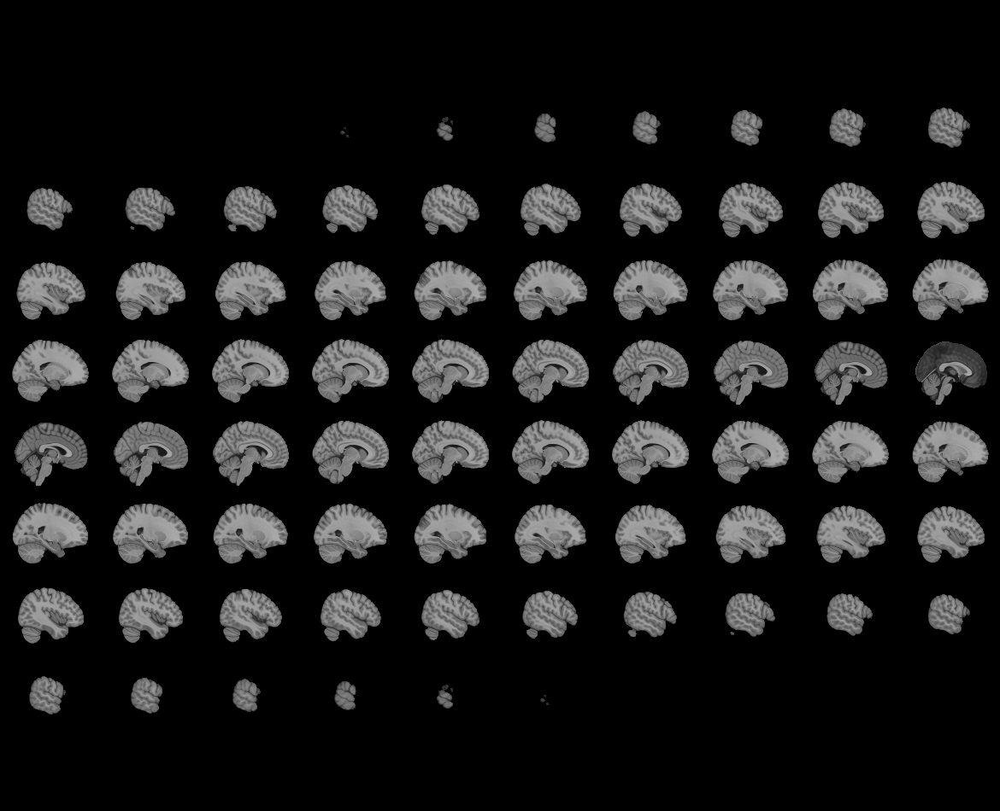
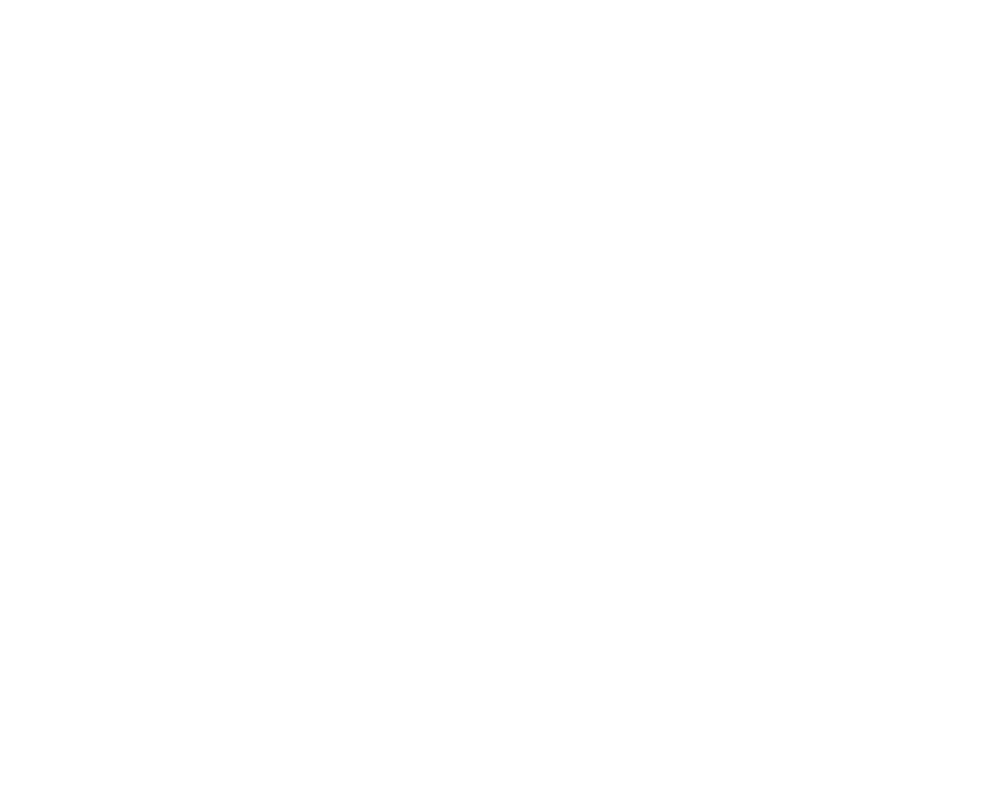

In [78]:
plotting.view_img(thresholded_map,
                  threshold=zthresh,
                  symmetric_cmap=True)

/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/plotting/surf_plotting.py:421: RuntimeWarning: invalid value encountered in true_divide
  data_copy /= (vmax - vmin)


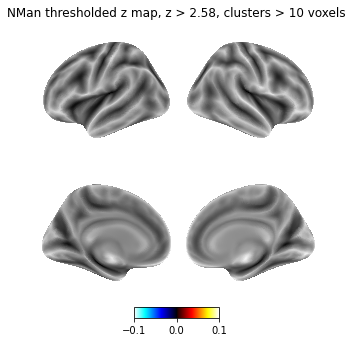

In [79]:
plotting.plot_img_on_surf(thresholded_map,
                          surf_mesh='fsaverage', # comment out for faster default (fsaverage5)
                          views=['lateral', 'medial'],
                          hemispheres=['left', 'right'],
                          inflate=True,
                          threshold=zthresh,
                          #cmap='Reds',
                          colorbar=True,
                          title='%s thresholded z map, z > %.02f, clusters > %d voxels'%(group_label, threshold, cthresh))
plotting.show()

/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/plotting/displays/_slicers.py:382: UserWarning: empty mask
  get_mask_bounds(new_img_like(img, not_mask, affine))


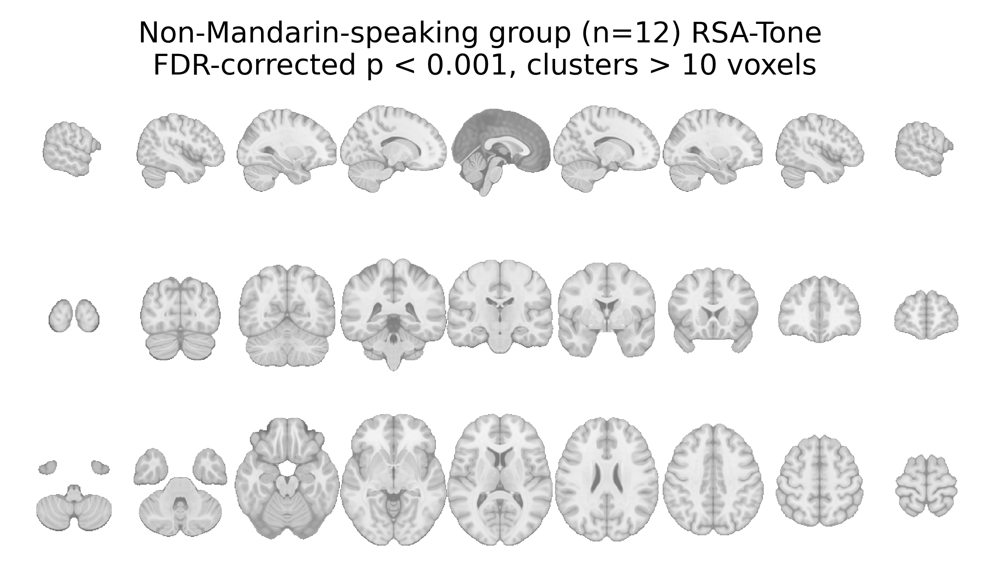

In [80]:
title = ('Non-Mandarin-speaking group (n=%d) RSA-%s \n'
         'FDR-corrected p < %.03f, clusters > %d voxels'%(len(sub_list_nman), model_label, alpha, cthresh))

#fig = plt.figure(constrained_layout=True, figsize=(8,4), dpi=500)
#subfigs = fig.subfigures(nrows=3, ncols=1)
fig, axes = plt.subplots(3, 1, figsize=(6,3), dpi=500)
fig.suptitle(title, fontsize='medium')

fig_fpath = os.path.join(l2_dir, 
                         f'group-{group_label}_rsa-searchlight_model-{model_label}_searchrad-{searchrad}_fwhm-{fwhm}_map-zstat_slice.png')

plotting.plot_stat_map(thresholded_map, 
                       bg_img=mni152_template, 
                       black_bg=False,
                       display_mode='x',
                       cut_coords=[-60, -45, -30, -15, 0, 15, 30, 45, 60],
                       colorbar=False,
                       annotate=False,
                       #title=title,
                       figure=fig, 
                       axes=axes[0])
plotting.plot_stat_map(thresholded_map, 
                       bg_img=mni152_template, 
                       black_bg=False,
                       display_mode='y',
                       cut_coords=[-100, -80, -60, -40, -20, 0, 20, 40, 60],
                       colorbar=False,
                       annotate=False,
                       #title=title,
                       figure=fig, 
                       axes=axes[1])
plotting.plot_stat_map(thresholded_map, 
                       bg_img=mni152_template, 
                       black_bg=False,
                       display_mode='z',
                       cut_coords=[-50, -35, -20, -5, 10, 25, 40, 55, 70],
                       colorbar=False,
                       annotate=False,
                       #title=title,
                       #figure=fig, 
                       axes=axes[2])

#fig.savefig(fig_fpath)
#print('file saved to ', fig_fpath)

### Group differences in RSA searchlight

In [51]:
#second_level_model = SecondLevelModel().fit(smoothed_l1_fnames_groupdiff, design_matrix=design_mat_groupdiff)
second_level_model = SecondLevelModel().fit(diff_img_list, design_matrix=design_mat_groupdiff)
z_map_diff = second_level_model.compute_contrast(second_level_contrast=[1, -1,], output_type='z_score')

In [ ]:
'''
for model_label in [model_label]: #model_list:
    print(model_label)
    l1_fnames_groupdiff = [sorted(glob(l1_dir+'/%s_space-%s/%s/'%(sub_id, space_label, search_label) +
                                   '%s_rsa-searchlight_model-%s.nii.gz'%(sub_id, model_label)))[0] for sub_id in subjects_label]
    
    diff_img_list = []
    for sx, sub_sl_fpath in enumerate(l1_fnames_groupdiff):

        sub_sl_img = nib.load(sub_sl_fpath)
        sub_sl_data = sub_sl_img.get_fdata()

        # fisher transform r-to-z
        diff_data = np.arctanh(sub_sl_data)
        diff_img = new_img_like(sub_sl_img, diff_data)
        diff_img_list.append(diff_img)

    second_level_model = SecondLevelModel().fit(diff_img_list, design_matrix=design_mat_groupdiff)
    z_map_diff = second_level_model.compute_contrast(second_level_contrast=[1, -1,], output_type='z_score')

    group_label = 'diff-Mand-gt-NMan'
    out_fname = 'group-{}_{}_model-{}_map-zstat.nii.gz'.format(group_label, search_label, model_label) 
    out_fpath = os.path.join(l2_dir, out_fname)
    nib.save(z_map_diff, out_fpath)
'''

In [52]:
threshold = 2.58
cthresh = 10
thresh_diff_map = threshold_img(
                                z_map_diff,
                                threshold=threshold,
                                cluster_threshold=cthresh,
                                two_sided=True,
                            )

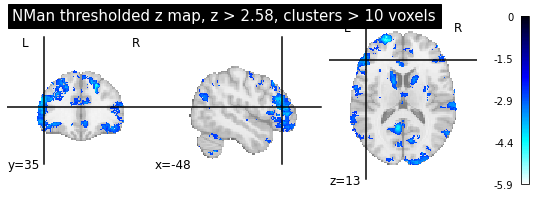

In [53]:
plotting.plot_stat_map(
    thresh_diff_map, 
    title='%s thresholded z map, z > %.02f, clusters > %d voxels'%(group_label, threshold, cthresh))

/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/numpy/core/fromnumeric.py:758: UserWarning: Warning: 'partition' will ignore the 'mask' of the MaskedArray.
  a.partition(kth, axis=axis, kind=kind, order=order)



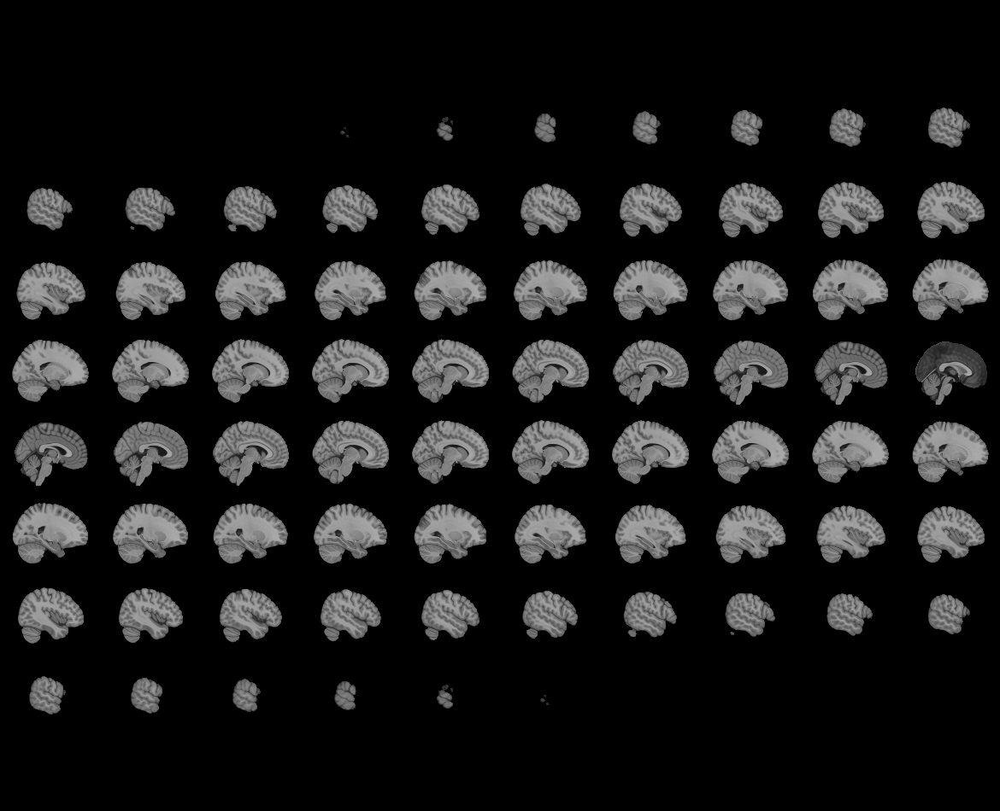
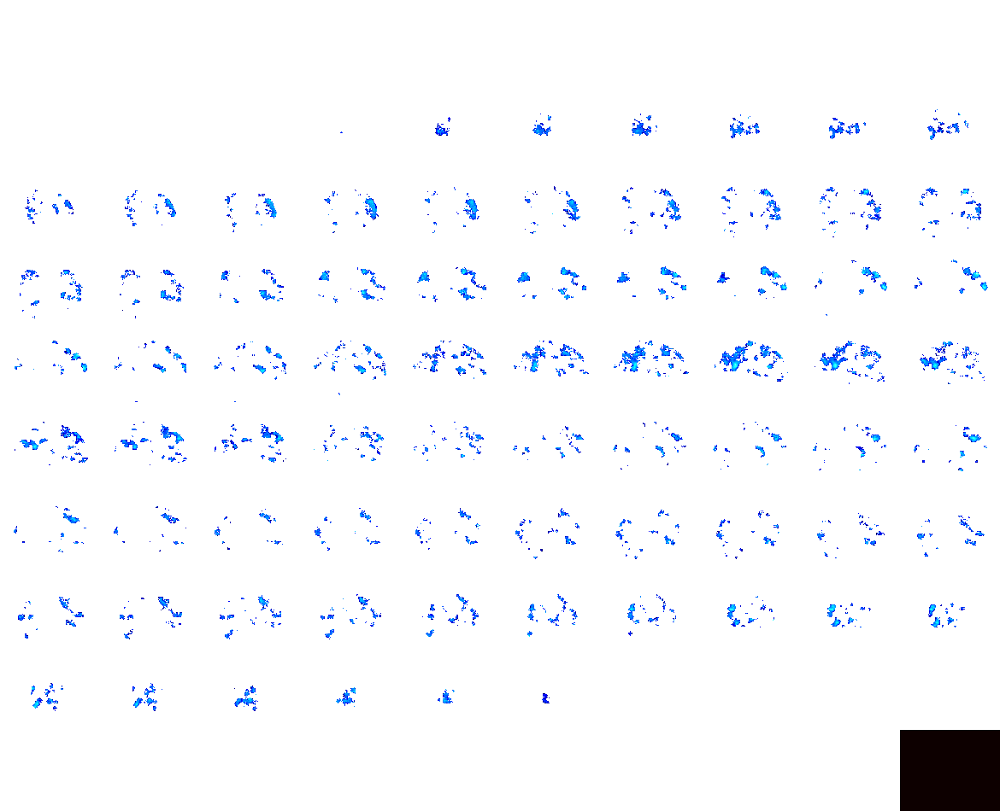

In [54]:
plotting.view_img(thresh_diff_map,
                  threshold=threshold,
                  symmetric_cmap=True)

In [ ]:
plotting.plot_img_on_surf(thresh_diff_map,
                          #surf_mesh='fsaverage', # comment out for faster default (fsaverage5)
                          views=['lateral', 'medial'],
                          hemispheres=['left', 'right'],
                          inflate=True,
                          threshold=threshold,
                          #cmap='Reds',
                          colorbar=True,
                          title='%s thresholded z map, z > %.02f, clusters > %d voxels'%(group_label, threshold, cthresh))
plotting.show()

## loop over all images and save

In [ ]:
for group_label in ['Mand', 'NMan', 'diff-Mand-gt-NMan']: #
    for model_label in model_list:
        img_fname = 'group-{}_rsa-searchlight_model-{}_map-zstat.nii.gz'.format(group_label, model_label)
        img_fpath = os.path.join(l2_dir, img_fname)

        fig_fpath = os.path.join('level-2_out', 
                                 'group-{}_rsa-searchlight_model-{}_map-zstat.png'.format(group_label, 
                                                                                          model_label))
        title='group-%s model-%s\nz > %.02f – clusters > %d voxels'%(group_label, model_label, threshold, cthresh)
        threshold = 2.58
        cthresh = 10
        thresholded_map = threshold_img(
                                        img_fpath,
                                        threshold=threshold,
                                        cluster_threshold=cthresh,
                                        two_sided=True,
                                    )
        #fig, ax = plt.subplots(subplot_kw={"projection": "3d"}, figsize=(5,4), dpi=500)
        fig, ax = plotting.plot_img_on_surf(thresholded_map,
                                  surf_mesh='fsaverage',
                                  views=['lateral', 'medial'],
                                  hemispheres=['left', 'right'],
                                  inflate=True,
                                  threshold=threshold,
                                  colorbar=True,
                                  title=title,
                                  #kwargs={'figure':fig, 'axes':ax}
                                 )
        fig.savefig(fig_fpath)
        print('file saved to ', fig_fpath)

In [ ]:
threshold = 2.58
cthresh = 10
    
for group_label in ['Mand', 'NMan', 'diff-Mand-gt-NMan']: # 'Mand', 'NMan', 'diff-Mand-gt-NMan'
    for model_label in model_list:
        title='group-%s model-%s \n z > %.02f – clusters > %d voxels'%(group_label, model_label, threshold, cthresh)
        
        #fig = plt.figure(constrained_layout=True, figsize=(8,4), dpi=500)
        #subfigs = fig.subfigures(nrows=3, ncols=1)
        fig, axes = plt.subplots(3, 1, figsize=(6,3), dpi=500)
        fig.suptitle(title)
        
        img_fname = 'group-{}_rsa-searchlight_model-{}_map-zstat.nii.gz'.format(group_label, model_label)
        img_fpath = os.path.join(l2_dir, img_fname)

        fig_fpath = os.path.join('level-2_out', 
                                 'group-{}_rsa-searchlight_model-{}_map-zstat_slice.png'.format(group_label, 
                                                                                          model_label))
        thresholded_map = threshold_img(
                                        img_fpath,
                                        threshold=threshold,
                                        cluster_threshold=cthresh,
                                        two_sided=True,
                                    )

        plotting.plot_stat_map(thresholded_map, 
                               bg_img=mni152_template, 
                               black_bg=False,
                               display_mode='x',
                               cut_coords=[-60, -45, -30, -15, 0, 15, 30, 45, 60],
                               colorbar=False,
                               annotate=False,
                               #title=title,
                               figure=fig, 
                               axes=axes[0])
        plotting.plot_stat_map(thresholded_map, 
                               bg_img=mni152_template, 
                               black_bg=False,
                               display_mode='y',
                               cut_coords=[-100, -80, -60, -40, -20, 0, 20, 40, 60],
                               colorbar=False,
                               annotate=False,
                               #title=title,
                               figure=fig, 
                               axes=axes[1])
        plotting.plot_stat_map(thresholded_map, 
                               bg_img=mni152_template, 
                               black_bg=False,
                               display_mode='z',
                               cut_coords=[-50, -35, -20, -5, 10, 25, 40, 55, 70],
                               colorbar=False,
                               annotate=False,
                               #title=title,
                               #figure=fig, 
                               axes=axes[2])
        
        fig.savefig(fig_fpath)
        print('file saved to ', fig_fpath)

## All participants

In [54]:
group_label = 'all'

#second_level_model = SecondLevelModel().fit(smoothed_l1_fnames_groupdiff, design_matrix=design_mat_groupdiff)
second_level_model = SecondLevelModel().fit(diff_img_list, design_matrix=design_mat_groupdiff)
z_map_diff = second_level_model.compute_contrast(second_level_contrast=[1, 1,], output_type='z_score')

In [57]:
alpha = 0.001
cthresh = 10
cluster_correct = 'fdr'

thresholded_map, zthresh = threshold_stats_img(
                            z_map_diff,
                            alpha=alpha,
                            height_control=cluster_correct,
                            cluster_threshold=cthresh,
                            two_sided=False,
                        )

The fdr=0.001 threshold is 3.99


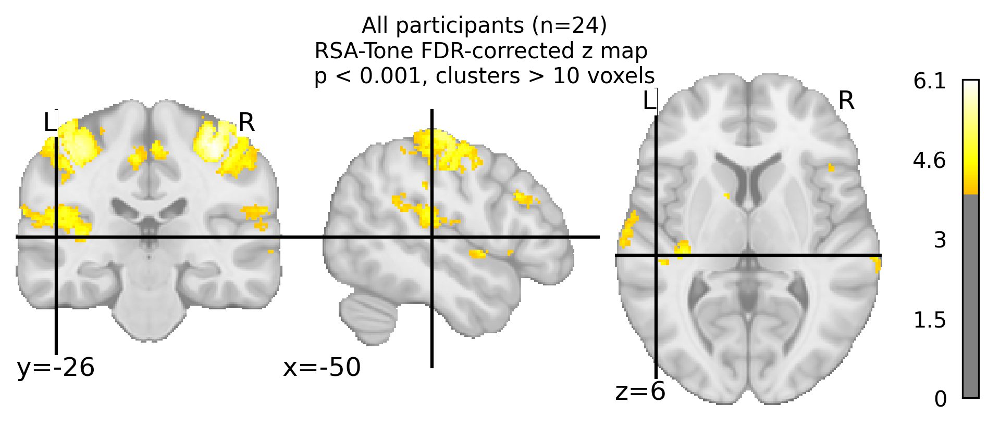

In [61]:
plot_title = ('All participants (n=%d)\n'
              'RSA-%s FDR-corrected z map \n'
              'p < %.04g, clusters > %d voxels'%(len(sub_list_mand+sub_list_nman), model_label, alpha, cthresh))

fig, ax = plt.subplots(figsize=(8,3), dpi=300)

plotting.plot_stat_map(
    thresholded_map, 
    threshold=zthresh,
    bg_img=mni152_template,
    black_bg=False,
    cut_coords=[-50, -26, 6],
    #display_mode='mosaic',
    #title=plot_title,
    axes=ax)
fig.suptitle(plot_title, fontsize=10);
print('The %s=%.3g threshold is %.3g' %(cluster_correct, alpha, zthresh))
#fig.savefig(os.path.join(l2_dir,
#                         f'group-{group_label}_mvpc-searchlight_searchmm-{search_radmm}_fwhm-{fwhm:02f}_alpha-{alpha}_correct-{cluster_correct}_cthresh-{cthresh}_map-zstat.png'))

/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/numpy/core/fromnumeric.py:758: UserWarning: Warning: 'partition' will ignore the 'mask' of the MaskedArray.
  a.partition(kth, axis=axis, kind=kind, order=order)
/bgfs/bchandrasekaran/krs228/software/miniconda3/envs/py3/lib/python3.9/site-packages/nilearn/plotting/html_document.py:59: UserWarning: It seems you have created more than 10 nilearn views. As each view uses dozens of megabytes of RAM, you might want to delete some of them.
  warnings.warn('It seems you have created more than {} '



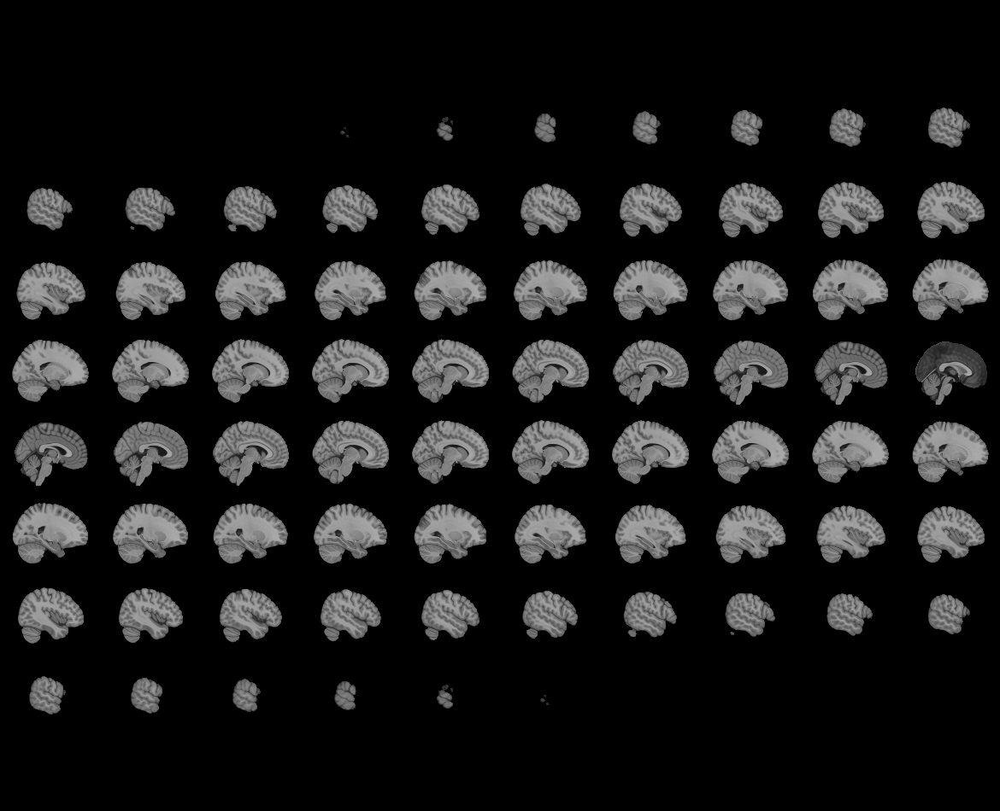
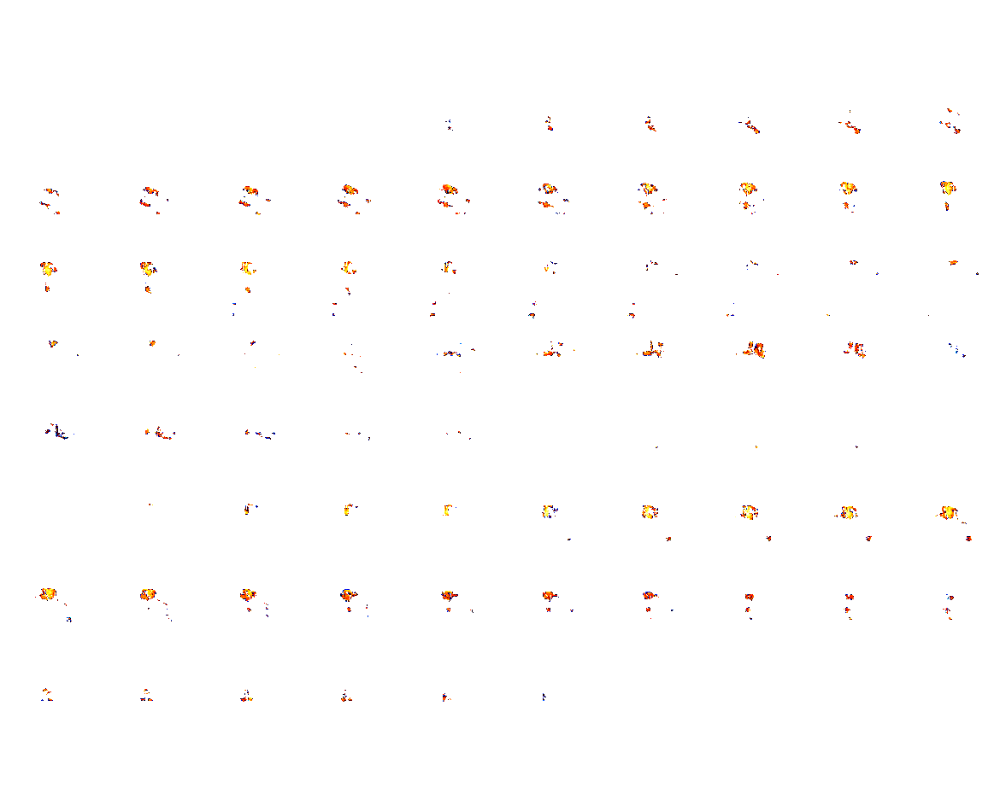

In [60]:
plotting.view_img(thresholded_map,
                  threshold=zthresh,
                  symmetric_cmap=False,
                  title='p < %.04g, clusters > %d voxels'%(alpha, cthresh))

file saved to  /bgfs/bchandrasekaran/krs228/data/FLT/data_denoised/derivatives/nilearn/level-2_fwhm-0.00/group-all_rsa-searchlight_model-Tone_searchrad-5_fwhm-0.0_map-zstat_slice.png


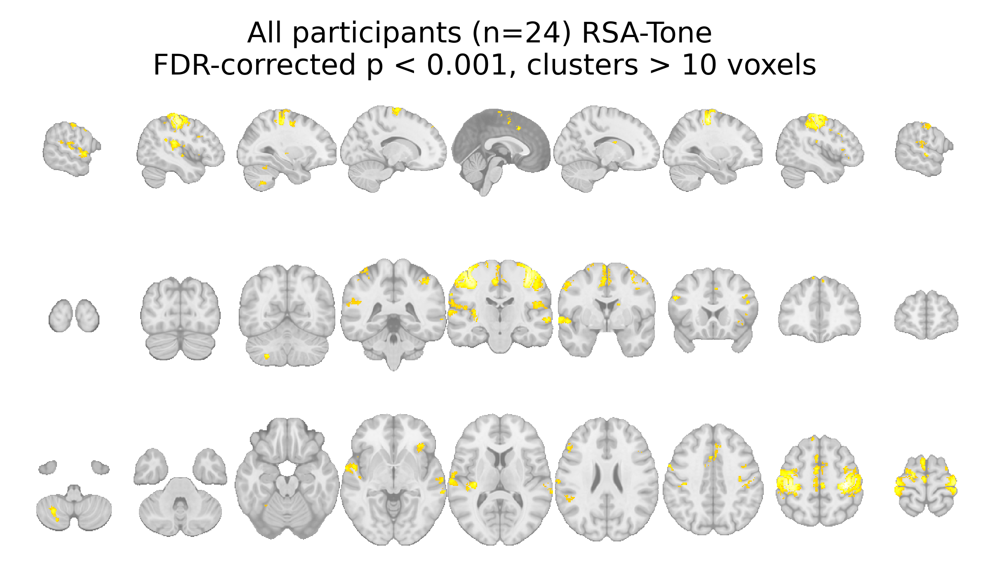

In [62]:
title = ('All participants (n=%d) RSA-%s \n'
         'FDR-corrected p < %.04g, clusters > %d voxels'%(len(sub_list_nman+sub_list_mand), model_label, alpha, cthresh))

#fig = plt.figure(constrained_layout=True, figsize=(8,4), dpi=500)
#subfigs = fig.subfigures(nrows=3, ncols=1)
fig, axes = plt.subplots(3, 1, figsize=(6,3), dpi=500)
fig.suptitle(title, fontsize='medium')

fig_fpath = os.path.join(l2_dir, 
                         f'group-{group_label}_rsa-searchlight_model-{model_label}_searchrad-{searchrad}_fwhm-{fwhm}_map-zstat_slice.png')

plotting.plot_stat_map(thresholded_map, 
                       bg_img=mni152_template, 
                       black_bg=False,
                       display_mode='x',
                       cut_coords=[-60, -45, -30, -15, 0, 15, 30, 45, 60],
                       colorbar=False,
                       annotate=False,
                       #title=title,
                       figure=fig, 
                       axes=axes[0])
plotting.plot_stat_map(thresholded_map, 
                       bg_img=mni152_template, 
                       black_bg=False,
                       display_mode='y',
                       cut_coords=[-100, -80, -60, -40, -20, 0, 20, 40, 60],
                       colorbar=False,
                       annotate=False,
                       #title=title,
                       figure=fig, 
                       axes=axes[1])
plotting.plot_stat_map(thresholded_map, 
                       bg_img=mni152_template, 
                       black_bg=False,
                       display_mode='z',
                       cut_coords=[-50, -35, -20, -5, 10, 25, 40, 55, 70],
                       colorbar=False,
                       annotate=False,
                       #title=title,
                       #figure=fig, 
                       axes=axes[2])

fig.savefig(fig_fpath)
print('file saved to ', fig_fpath)